In [ ]:
# Скачать библиотеки

#!pip3 install adjustText
#!pip3 install razdel
#!brew install --cask raze
#!pip install nltk
#!pipx install nltk
#!python -V

In [1]:
# Импорт необходимых библиотек
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

# Если NLTK ресурсы не загружены, раскомментируйте следующие строки:
nltk.download('punkt')
nltk.download('stopwords')

# Заданные документы
documents = [
    "Мама мыла раму и окно.",
    "Отец читал газету в кресле.",
    "Собака лает на прохожих.",
    "Кошка спит на подоконнике.",
    "Дети играют в футбол на стадионе.",
    "Мама готовит вкусный ужин.",
    "Отец ремонтирует автомобиль в гараже.",
    "Птицы поют на рассвете.",
    "Дети смотрят мультфильмы по телевизору.",
    "Собака и кошка дружат между собой."
]

[nltk_data] Downloading package punkt to /Users/alexrust/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alexrust/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:

stop_words = set(stopwords.words('russian'))

from razdel import tokenize

# Предобработка документов: удаление стоп-слов
processed_docs = []
for doc in documents:
    tokens = [token.text for token in tokenize(doc.lower())]
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stop_words]
    processed_docs.append(filtered_tokens)

print("Документы после удаления стоп-слов:")
for doc in processed_docs:
    print(doc)

Документы после удаления стоп-слов:
['мама', 'мыла', 'раму', 'окно']
['отец', 'читал', 'газету', 'кресле']
['собака', 'лает', 'прохожих']
['кошка', 'спит', 'подоконнике']
['дети', 'играют', 'футбол', 'стадионе']
['мама', 'готовит', 'вкусный', 'ужин']
['отец', 'ремонтирует', 'автомобиль', 'гараже']
['птицы', 'поют', 'рассвете']
['дети', 'смотрят', 'мультфильмы', 'телевизору']
['собака', 'кошка', 'дружат', 'собой']


In [3]:
# Шаг 2: Стемминг/нормализация

# Инициализация стеммера для русского языка
stemmer = SnowballStemmer("russian")

# Стемминг токенов
stemmed_docs = []
for doc in processed_docs:
    stemmed_tokens = [stemmer.stem(word) for word in doc]
    stemmed_docs.append(stemmed_tokens)

print("\nДокументы после стемминга:")
for doc in stemmed_docs:
    print(doc)


Документы после стемминга:
['мам', 'мыл', 'рам', 'окн']
['отец', 'чита', 'газет', 'кресл']
['собак', 'лает', 'прохож']
['кошк', 'спит', 'подоконник']
['дет', 'игра', 'футбол', 'стадион']
['мам', 'готов', 'вкусн', 'ужин']
['отец', 'ремонтир', 'автомобил', 'гараж']
['птиц', 'поют', 'рассвет']
['дет', 'смотр', 'мультфильм', 'телевизор']
['собак', 'кошк', 'дружат', 'соб']


In [4]:
# Индексируемые слова – это слова после удаления стоп-слов и стемминга. Мы будем использовать их для построения матрицы частотности.

# Составление списка уникальных слов (термов)
terms = set()
for doc in stemmed_docs:
    for word in doc:
        terms.add(word)
terms = sorted(list(terms))

print("\nИндексируемые слова (термы):")
print(terms)


Индексируемые слова (термы):
['автомобил', 'вкусн', 'газет', 'гараж', 'готов', 'дет', 'дружат', 'игра', 'кошк', 'кресл', 'лает', 'мам', 'мультфильм', 'мыл', 'окн', 'отец', 'подоконник', 'поют', 'прохож', 'птиц', 'рам', 'рассвет', 'ремонтир', 'смотр', 'соб', 'собак', 'спит', 'стадион', 'телевизор', 'ужин', 'футбол', 'чита']


In [5]:
# Инициализация матрицы частотности
term_doc_matrix = pd.DataFrame(0, index=terms, columns=[f"Doc{i+1}" for i in range(len(documents))])

# Заполнение матрицы частотности
for i, doc in enumerate(stemmed_docs):
    for word in doc:
        term_doc_matrix.at[word, f"Doc{i+1}"] += 1

print("\nМатрица частотности терминов в документах:")
print(term_doc_matrix)


Матрица частотности терминов в документах:
            Doc1  Doc2  Doc3  Doc4  Doc5  Doc6  Doc7  Doc8  Doc9  Doc10
автомобил      0     0     0     0     0     0     1     0     0      0
вкусн          0     0     0     0     0     1     0     0     0      0
газет          0     1     0     0     0     0     0     0     0      0
гараж          0     0     0     0     0     0     1     0     0      0
готов          0     0     0     0     0     1     0     0     0      0
дет            0     0     0     0     1     0     0     0     1      0
дружат         0     0     0     0     0     0     0     0     0      1
игра           0     0     0     0     1     0     0     0     0      0
кошк           0     0     0     1     0     0     0     0     0      1
кресл          0     1     0     0     0     0     0     0     0      0
лает           0     0     1     0     0     0     0     0     0      0
мам            1     0     0     0     0     1     0     0     0      0
мультфильм     0    

In [18]:
# Шаг 5: Сингулярное разложение (SVD)

# Мы выполним SVD для полученной матрицы терм-документ, описывающую частоту терминов, которые встречаются в коллекции документов

# Преобразуем матрицу в формат numpy
X = term_doc_matrix.values

# Выполнение SVD
U, Sigma, VT = np.linalg.svd(X, full_matrices=False)

print("\nСингулярные значения:")
print(Sigma)


Сингулярные значения:
[2.23606798 2.23606798 2.23606798 2.23606798 1.73205081 1.73205081
 1.73205081 1.73205081 1.73205081 1.41421356]


In [19]:
# Используем TruncatedSVD для уменьшения размерности до 2
svd = TruncatedSVD(n_components=2)
X_reduced = svd.fit_transform(X.T)

# Получим координаты документов
doc_coords = X_reduced

# Получим координаты терминов
term_coords = svd.components_.T

print("\nКоординаты документов в двумерном пространстве:")
for i, coord in enumerate(doc_coords):
    print(f"Doc{i+1}: {coord}")

print("\nКоординаты терминов в двумерном пространстве:")
for i, coord in enumerate(term_coords):
    print(f"{terms[i]}: {coord}")


Координаты документов в двумерном пространстве:
Doc1: [3.38191748e-16 1.58113883e+00]
Doc2: [ 1.36834461e+00 -1.08854887e-15]
Doc3: [-3.30683282e-01  4.11570684e-16]
Doc4: [-3.30683282e-01 -1.09248943e-16]
Doc5: [-5.47337846e-01  1.96977688e-16]
Doc6: [2.41872608e-15 1.58113883e+00]
Doc7: [ 1.36834461e+00 -6.83123861e-16]
Doc8: [-1.15261922e-17  2.26174557e-16]
Doc9: [-5.47337846e-01  4.34416887e-16]
Doc10: [-6.61366564e-01  4.70926074e-16]

Координаты терминов в двумерном пространстве:
автомобил: [ 2.73668923e-01 -1.99013038e-16]
вкусн: [5.71938465e-16 3.16227766e-01]
газет: [ 2.73668923e-01 -2.56343206e-16]
гараж: [ 2.73668923e-01 -1.13148658e-16]
готов: [6.33864425e-16 3.16227766e-01]
дет: [-2.18935138e-01  1.38905007e-16]
дружат: [-1.32273313e-01  1.19143810e-16]
игра: [-1.09467569e-01  1.81463034e-17]
кошк: [-1.98409969e-01  3.65994209e-17]
кресл: [ 2.73668923e-01 -2.55240248e-16]
лает: [-6.61366564e-02  1.06076962e-16]
мам: [5.76013830e-16 6.32455532e-01]
мультфильм: [-1.0946756

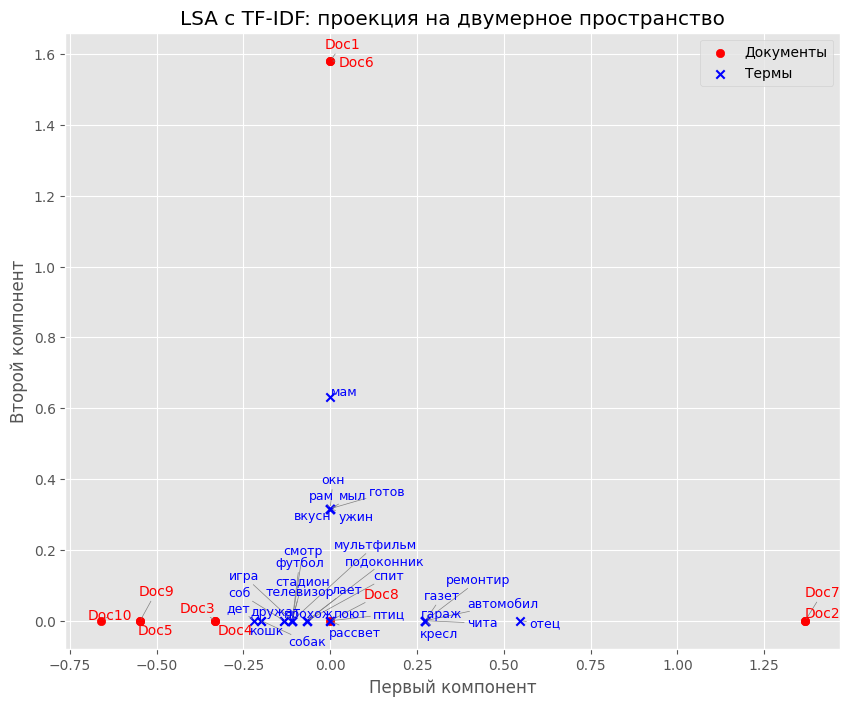

In [20]:
from adjustText import adjust_text
import matplotlib.pyplot as plt 

plt.style.use('ggplot')

# Построение графика
plt.figure(figsize=(10, 8))

# Отображение документов
plt.scatter(doc_coords[:, 0], doc_coords[:, 1], marker='o', color='red', label='Документы')

# Отображение терминов
plt.scatter(term_coords[:, 0], term_coords[:, 1], marker='x', color='blue', label='Термы')

texts = []

# Добавление меток документов
for i, (x, y) in enumerate(doc_coords):
    texts.append(plt.text(x, y, f'Doc{i+1}', color='red'))

# Добавление меток терминов
for i, (x, y) in enumerate(term_coords):
    texts.append(plt.text(x, y, terms[i], color='blue', fontsize=9))

plt.xlabel('Первый компонент')
plt.ylabel('Второй компонент')
plt.legend()
plt.title('LSA с TF-IDF: проекция на двумерное пространство')
plt.grid(True)

# Автоматическая регулировка меток
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey'))

plt.show()

In [21]:
# # Шаг 7: Визуализация результатов

# # Построение графика
# plt.figure(figsize=(10, 8))

# # Отображение документов
# plt.scatter(doc_coords[:, 0], doc_coords[:, 1], marker='o', color='red', label='Документы')
# for i, (x, y) in enumerate(doc_coords):
#     plt.text(x+0.02, y+0.02, f'Doc{i+1}', color='red')

# # Отображение терминов
# plt.scatter(term_coords[:, 0], term_coords[:, 1], marker='x', color='blue', label='Термы')
# for i, (x, y) in enumerate(term_coords):
#     plt.text(x+0.02, y+0.02, terms[i], color='blue')

# plt.xlabel('Первый компонент')
# plt.ylabel('Второй компонент')
# plt.legend()
# plt.title('LSA: проекция документов и терминов на двумерное пространство')
# plt.grid(True)
# plt.show()

# Теперь то же самое с оптимизацией алгоритма

In [19]:
# Импорт необходимых библиотек
import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfTransformer
from scipy.sparse import csr_matrix

# Если NLTK ресурсы не загружены, раскомментируйте следующие строки:
# nltk.download('punkt')
# nltk.download('stopwords')

# Заданные документы
documents = [
    "Мама мыла раму и окно.",
    "Отец читал газету в кресле.",
    "Собака лает на прохожих.",
    "Кошка спит на подоконнике.",
    "Дети играют в футбол на стадионе.",
    "Мама готовит вкусный ужин.",
    "Отец ремонтирует автомобиль в гараже.",
    "Птицы поют на рассвете.",
    "Дети смотрят мультфильмы по телевизору.",
    "Собака и кошка дружат между собой."
]

In [22]:
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
stop_words = set(stopwords.words('russian'))

from razdel import tokenize

# Предобработка документов: удаление стоп-слов
processed_docs = []
for doc in documents:
    tokens = [token.text for token in tokenize(doc.lower())]
    filtered_tokens = [word for word in tokens if word.isalpha() and word not in stop_words]
    processed_docs.append(filtered_tokens)

print("Документы после удаления стоп-слов:")
for doc in processed_docs:
    print(doc)

# Шаг 2: Стемминг/нормализация

# Инициализация стеммера для русского языка
stemmer = SnowballStemmer("russian")

# Стемминг токенов
stemmed_docs = []
for doc in processed_docs:
    stemmed_tokens = [stemmer.stem(word) for word in doc]
    stemmed_docs.append(stemmed_tokens)

print("\nДокументы после стемминга:")
for doc in stemmed_docs:
    print(doc)

Документы после удаления стоп-слов:
['мама', 'мыла', 'раму', 'окно']
['отец', 'читал', 'газету', 'кресле']
['собака', 'лает', 'прохожих']
['кошка', 'спит', 'подоконнике']
['дети', 'играют', 'футбол', 'стадионе']
['мама', 'готовит', 'вкусный', 'ужин']
['отец', 'ремонтирует', 'автомобиль', 'гараже']
['птицы', 'поют', 'рассвете']
['дети', 'смотрят', 'мультфильмы', 'телевизору']
['собака', 'кошка', 'дружат', 'собой']

Документы после стемминга:
['мам', 'мыл', 'рам', 'окн']
['отец', 'чита', 'газет', 'кресл']
['собак', 'лает', 'прохож']
['кошк', 'спит', 'подоконник']
['дет', 'игра', 'футбол', 'стадион']
['мам', 'готов', 'вкусн', 'ужин']
['отец', 'ремонтир', 'автомобил', 'гараж']
['птиц', 'поют', 'рассвет']
['дет', 'смотр', 'мультфильм', 'телевизор']
['собак', 'кошк', 'дружат', 'соб']


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alexrust/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [24]:
# Преобразование списка токенов в строку для каждого документа
documents_for_vectorizer = [' '.join(doc) for doc in stemmed_docs]

# Создание матрицы частотности
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
X_counts = vectorizer.fit_transform(documents_for_vectorizer)

# Вывод словаря
terms = vectorizer.get_feature_names_out()
print("\nИндексируемые слова (термы):")
print(terms)


Индексируемые слова (термы):
['автомобил' 'вкусн' 'газет' 'гараж' 'готов' 'дет' 'дружат' 'игра' 'кошк'
 'кресл' 'лает' 'мам' 'мультфильм' 'мыл' 'окн' 'отец' 'подоконник' 'поют'
 'прохож' 'птиц' 'рам' 'рассвет' 'ремонтир' 'смотр' 'соб' 'собак' 'спит'
 'стадион' 'телевизор' 'ужин' 'футбол' 'чита']


In [28]:
# Применение TF-IDF трансформера
tfidf_transformer = TfidfTransformer()
X_tfidf = tfidf_transformer.fit_transform(X_counts)

# Преобразуем в DataFrame для удобства
tfidf_matrix = pd.DataFrame(X_tfidf.toarray(), columns=terms)


tfidf_matrix.index = [f'Doc{i+1}' for i in range(len(documents))]

print("\nTF-IDF матрица терминов в документах:")
print(round(tfidf_matrix, 2))


TF-IDF матрица терминов в документах:
       автомобил  вкусн  газет  гараж  готов   дет  дружат  игра  кошк  кресл  \
Doc1        0.00   0.00   0.00   0.00   0.00  0.00    0.00  0.00  0.00   0.00   
Doc2        0.00   0.00   0.52   0.00   0.00  0.00    0.00  0.00  0.00   0.52   
Doc3        0.00   0.00   0.00   0.00   0.00  0.00    0.00  0.00  0.00   0.00   
Doc4        0.00   0.00   0.00   0.00   0.00  0.00    0.00  0.00  0.52   0.00   
Doc5        0.00   0.00   0.00   0.00   0.00  0.44    0.00  0.52  0.00   0.00   
Doc6        0.00   0.52   0.00   0.00   0.52  0.00    0.00  0.00  0.00   0.00   
Doc7        0.52   0.00   0.00   0.52   0.00  0.00    0.00  0.00  0.00   0.00   
Doc8        0.00   0.00   0.00   0.00   0.00  0.00    0.00  0.00  0.00   0.00   
Doc9        0.00   0.00   0.00   0.00   0.00  0.44    0.00  0.00  0.00   0.00   
Doc10       0.00   0.00   0.00   0.00   0.00  0.00    0.54  0.00  0.46   0.00   

       ...  ремонтир  смотр   соб  собак  спит  стадион  телевизор  у

In [29]:
# Преобразуем матрицу в формат numpy
X = tfidf_matrix.values

# Проверка формы матрицы
print("\nРазмерности TF-IDF матрицы:", X.shape)


Размерности TF-IDF матрицы: (10, 32)


In [30]:
# Используем TruncatedSVD для уменьшения размерности до 2
svd_2d = TruncatedSVD(n_components=2)
X_2d = svd_2d.fit_transform(X)

# Получим координаты документов в 2D
doc_coords_2d = X_2d

# Получим координаты терминов в 2D
term_coords_2d = svd_2d.components_.T

print("\nКоординаты документов в двумерном пространстве:")
for i, coord in enumerate(doc_coords_2d):
    print(f"Doc{i+1}: {coord}")

print("\nКоординаты терминов в двумерном пространстве:")
for i, coord in enumerate(term_coords_2d):
    print(f"{terms[i]}: {coord}")


Координаты документов в двумерном пространстве:
Doc1: [ 5.72925150e-17 -3.09392872e-17]
Doc2: [-1.30409585e-16  7.66730880e-01]
Doc3: [5.77426235e-01 1.71987389e-15]
Doc4: [5.77426235e-01 4.86093950e-16]
Doc5: [ 1.05416309e-15 -9.58413600e-02]
Doc6: [2.04141687e-16 4.00094709e-16]
Doc7: [-3.7521422e-16  7.6673088e-01]
Doc8: [-4.24342659e-17  4.81461594e-15]
Doc9: [ 1.24093777e-15 -9.58413600e-02]
Doc10: [ 8.16604012e-01 -8.19466500e-16]

Координаты терминов в двумерном пространстве:
автомобил: [-1.69563255e-16  3.32787690e-01]
вкусн: [1.26133702e-16 2.24447056e-16]
газет: [-1.09212934e-16  3.32787690e-01]
гараж: [-1.81234153e-16  3.32787690e-01]
готов: [9.35179980e-17 2.54645272e-16]
дет: [ 8.77893495e-16 -7.07249850e-02]
дружат: [ 3.29871125e-01 -7.99733427e-16]
игра: [ 4.19761942e-16 -4.15984613e-02]
кошк: [ 5.03476007e-01 -2.35796304e-16]
кресл: [3.86083866e-18 3.32787690e-01]
лает: [2.62389931e-01 1.27639301e-15]
мам: [8.11735061e-17 1.17457945e-16]
мультфильм: [ 5.39962557e-16 -4

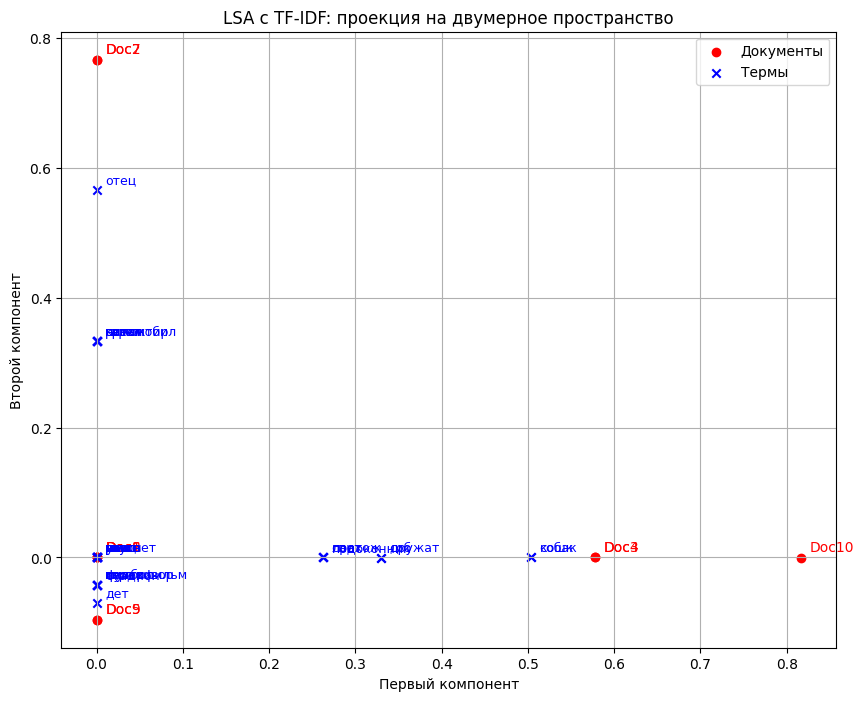

In [31]:
# Построение графика
plt.figure(figsize=(10, 8))

# Отображение документов
plt.scatter(doc_coords_2d[:, 0], doc_coords_2d[:, 1], marker='o', color='red', label='Документы')
for i, (x, y) in enumerate(doc_coords_2d):
    plt.text(x+0.01, y+0.01, f'Doc{i+1}', color='red')

# Отображение терминов
plt.scatter(term_coords_2d[:, 0], term_coords_2d[:, 1], marker='x', color='blue', label='Термы')
for i, (x, y) in enumerate(term_coords_2d):
    plt.text(x+0.01, y+0.01, terms[i], color='blue', fontsize=9)

plt.xlabel('Первый компонент')
plt.ylabel('Второй компонент')
plt.legend()
plt.title('LSA с TF-IDF: проекция на двумерное пространство')
plt.grid(True)
plt.show()

In [32]:
# Используем TruncatedSVD для уменьшения размерности до 3
svd_3d = TruncatedSVD(n_components=3)
X_3d = svd_3d.fit_transform(X)

# Получим координаты документов в 3D
doc_coords_3d = X_3d

# Получим координаты терминов в 3D
term_coords_3d = svd_3d.components_.T

print("\nКоординаты документов в трехмерном пространстве:")
for i, coord in enumerate(doc_coords_3d):
    print(f"Doc{i+1}: {coord}")

print("\nКоординаты терминов в трехмерном пространстве:")
for i, coord in enumerate(term_coords_3d):
    print(f"{terms[i]}: {coord}")


Координаты документов в трехмерном пространстве:
Doc1: [ 3.86202096e-17  7.72697748e-01 -8.67993722e-17]
Doc2: [ 2.51353870e-15 -3.40414202e-17  7.72697748e-01]
Doc3: [ 5.77426235e-01  5.89664215e-16 -4.11635060e-15]
Doc4: [ 5.77426235e-01 -3.00273893e-16 -1.83363912e-15]
Doc5: [ 8.39352369e-16 -1.61395004e-16 -3.53983785e-16]
Doc6: [1.05341567e-16 7.72697748e-01 9.67201435e-17]
Doc7: [ 2.57360612e-15 -5.92940918e-17  7.72697748e-01]
Doc8: [8.52820504e-16 3.32216658e-16 1.60575185e-15]
Doc9: [ 8.24950398e-16 -1.27309053e-16  2.41250849e-15]
Doc10: [ 8.16604012e-01  3.03152051e-16 -9.19363478e-16]

Координаты терминов в трехмерном пространстве:
автомобил: [1.26481195e-15 5.20649541e-17 3.35377517e-01]
вкусн: [8.11055481e-17 3.35377517e-01 4.23674911e-17]
газет: [1.08746425e-15 5.63165610e-17 3.35377517e-01]
гараж: [ 1.07892220e-15 -6.67055586e-17  3.35377517e-01]
готов: [8.76814423e-17 3.35377517e-01 4.52851471e-17]
дет: [5.33276866e-16 2.89401589e-18 7.42669670e-16]
дружат: [3.2987112

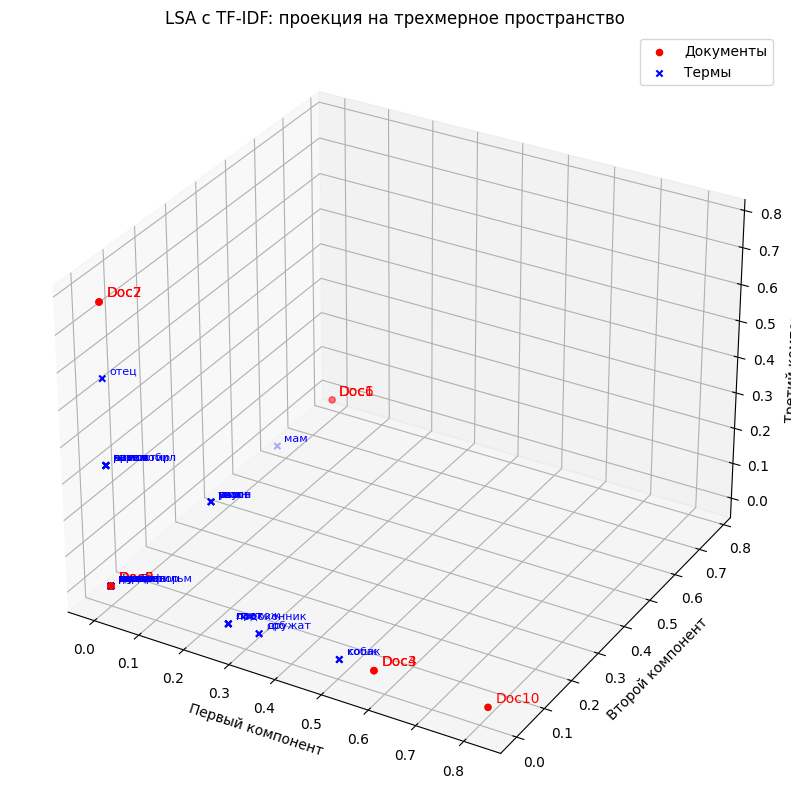

In [33]:
from mpl_toolkits.mplot3d import Axes3D

# Построение графика
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Отображение документов


ax.scatter(doc_coords_3d[:, 0], doc_coords_3d[:, 1], doc_coords_3d[:, 2], marker='o', color='red', label='Документы')
for i, (x, y, z) in enumerate(doc_coords_3d):
    ax.text(x+0.01, y+0.01, z+0.01, f'Doc{i+1}', color='red')

# Отображение терминов
ax.scatter(term_coords_3d[:, 0], term_coords_3d[:, 1], term_coords_3d[:, 2], marker='x', color='blue', label='Термы')
for i, (x, y, z) in enumerate(term_coords_3d):
    ax.text(x+0.01, y+0.01, z+0.01, terms[i], color='blue', fontsize=8)

ax.set_xlabel('Первый компонент')
ax.set_ylabel('Второй компонент')
ax.set_zlabel('Третий компонент')
ax.legend()
ax.set_title('LSA с TF-IDF: проекция на трехмерное пространство')
plt.show()

# Применение библиотеки AdjustText для лучшей визуализации

In [1]:
#!pip install adjustText

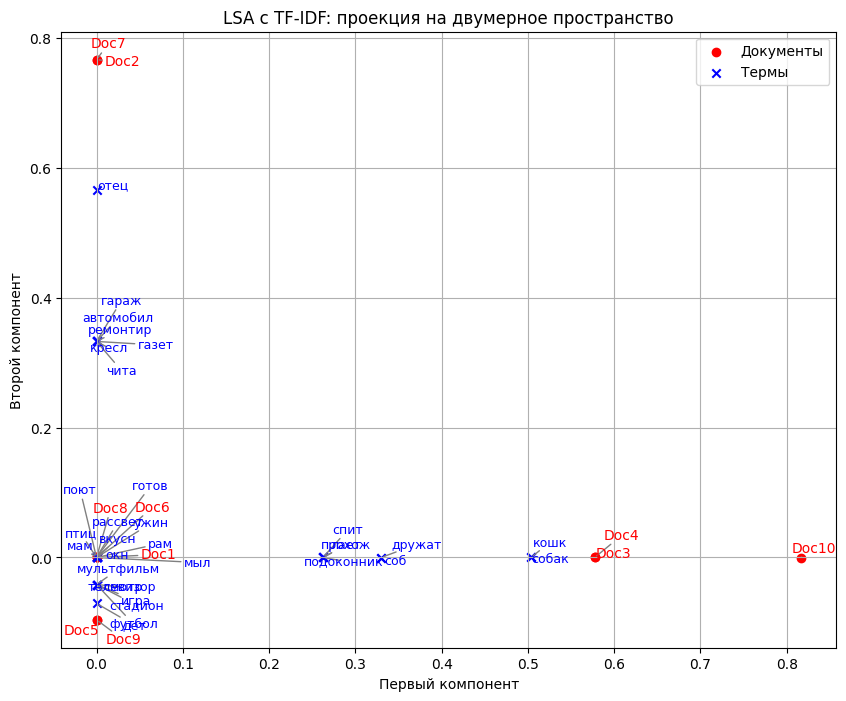

In [36]:
from adjustText import adjust_text

# Построение графика
plt.figure(figsize=(10, 8))

# Отображение документов
plt.scatter(doc_coords_2d[:, 0], doc_coords_2d[:, 1], marker='o', color='red', label='Документы')

# Отображение терминов
plt.scatter(term_coords_2d[:, 0], term_coords_2d[:, 1], marker='x', color='blue', label='Термы')

texts = []

# Добавление меток документов
for i, (x, y) in enumerate(doc_coords_2d):
    texts.append(plt.text(x, y, f'Doc{i+1}', color='red'))

# Добавление меток терминов
for i, (x, y) in enumerate(term_coords_2d):
    texts.append(plt.text(x, y, terms[i], color='blue', fontsize=9))

plt.xlabel('Первый компонент')
plt.ylabel('Второй компонент')
plt.legend()
plt.title('LSA с TF-IDF: проекция на двумерное пространство')
plt.grid(True)

# Автоматическая регулировка меток
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey'))

plt.show()

# Визуализация с помощью трёхмерного графика в plotly

In [39]:
import plotly.express as px
import pandas as pd

# Создание DataFrame
doc_data = pd.DataFrame(doc_coords_2d, columns=['x', 'y'])
doc_data['label'] = [f'Doc{i+1}' for i in range(len(doc_data))]
doc_data['type'] = 'Документ'

term_data = pd.DataFrame(term_coords_2d, columns=['x', 'y'])
term_data['label'] = terms
term_data['type'] = 'Термин'

data = pd.concat([doc_data, term_data], ignore_index=True)

# Построение интерактивного графика
fig = px.scatter(data, x='x', y='y', color='type', text='label', hover_name='label')

# Настройка отображения меток при наведении
fig.update_traces(textposition='top center')

fig.update_layout(
    title='LSA с TF-IDF: интерактивная проекция на двумерное пространство',
    xaxis_title='Первый компонент',
    yaxis_title='Второй компонент',
)

fig.show()

In [40]:
import plotly.express as px
import pandas as pd

# Создание DataFrame
doc_data = pd.DataFrame(doc_coords_3d, columns=['x', 'y', 'z'])
doc_data['label'] = [f'Doc{i+1}' for i in range(len(doc_data))]
doc_data['type'] = 'Документ'

term_data = pd.DataFrame(term_coords_3d, columns=['x', 'y', 'z'])
term_data['label'] = terms
term_data['type'] = 'Термин'

data = pd.concat([doc_data, term_data], ignore_index=True)

# Построение интерактивного 3D-графика
fig = px.scatter_3d(data, x='x', y='y', z='z', color='type', text='label', hover_name='label')

# Настройка отображения меток при наведении
fig.update_traces(textposition='top center')

fig.update_layout(
    title='LSA с TF-IDF: интерактивная проекция на трёхмерное пространство',
    scene=dict(
        xaxis_title='Первый компонент',
        yaxis_title='Второй компонент',
        zaxis_title='Третий компонент'
    )
)

fig.show()

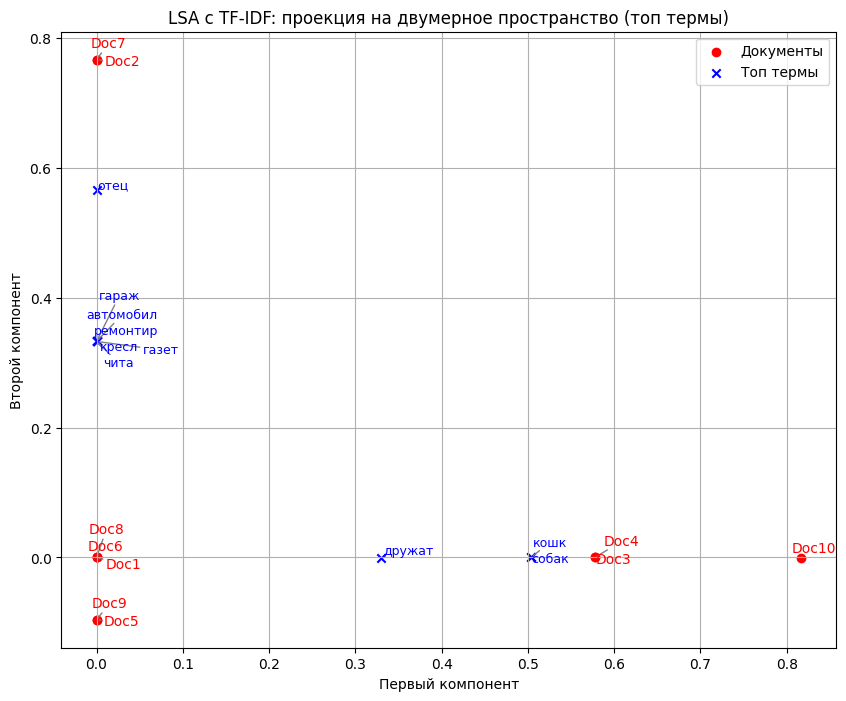

In [ ]:
# 3. Отображение только наиболее значимых терминов

#Чтобы уменьшить количество меток и избежать переполнения графика, можно отображать только наиболее значимые термины. Например, термины с наибольшим вкладом в компоненты SVD.

#Как это сделать:

#1. Вычислить веса терминов в компонентах SVD.
#2. Отсортировать термины по величине вкладов.
#3. Отобразить только топ-N терминов.

#Алгоритм:

#- Вычисляем важность каждого термина как сумму абсолютных значений его нагрузок в компонентах.
#- Отбираем топ-N терминов с наибольшей важностью.
#- На графике отображаем только эти термины, что уменьшает количество меток и улучшает читаемость.

#Код:

import numpy as np

# Получаем суммы квадратов нагрузок терминов по всем компонентам
term_importance = np.sum(np.abs(term_coords_2d), axis=1)

# Определяем количество терминов для отображения
top_n = 10

# Получаем индексы топ-N терминов
top_term_indices = np.argsort(term_importance)[-top_n:]

# Фильтруем координаты и термины
top_term_coords = term_coords_2d[top_term_indices]
top_terms = [terms[i] for i in top_term_indices]

from adjustText import adjust_text

# Построение графика
plt.figure(figsize=(10, 8))

# Отображение документов
plt.scatter(doc_coords_2d[:, 0], doc_coords_2d[:, 1], marker='o', color='red', label='Документы')

# Отображение терминов
plt.scatter(top_term_coords[:, 0], top_term_coords[:, 1], marker='x', color='blue', label='Топ термы')

texts = []

# Добавление меток документов
for i, (x, y) in enumerate(doc_coords_2d):
    texts.append(plt.text(x, y, f'Doc{i+1}', color='red'))

# Добавление меток терминов
for i, (x, y) in enumerate(top_term_coords):
    texts.append(plt.text(x, y, top_terms[i], color='blue', fontsize=9))

plt.xlabel('Первый компонент')
plt.ylabel('Второй компонент')
plt.legend()
plt.title('LSA с TF-IDF: проекция на двумерное пространство (топ термы)')
plt.grid(True)

# Автоматическая регулировка меток
adjust_text(texts, arrowprops=dict(arrowstyle='-', color='grey'))

plt.show()


In [ ]:
# Отображение меток под наклоном

# for i, (x, y) in enumerate(term_coords_2d):
#     plt.text(x+0.01, y+0.01, terms[i], color='blue', fontsize=8, rotation=45)

#!pip3 install 

## Выделение топ кластеров 

/Users/alexrust/Library/Python/3.8/lib/python/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



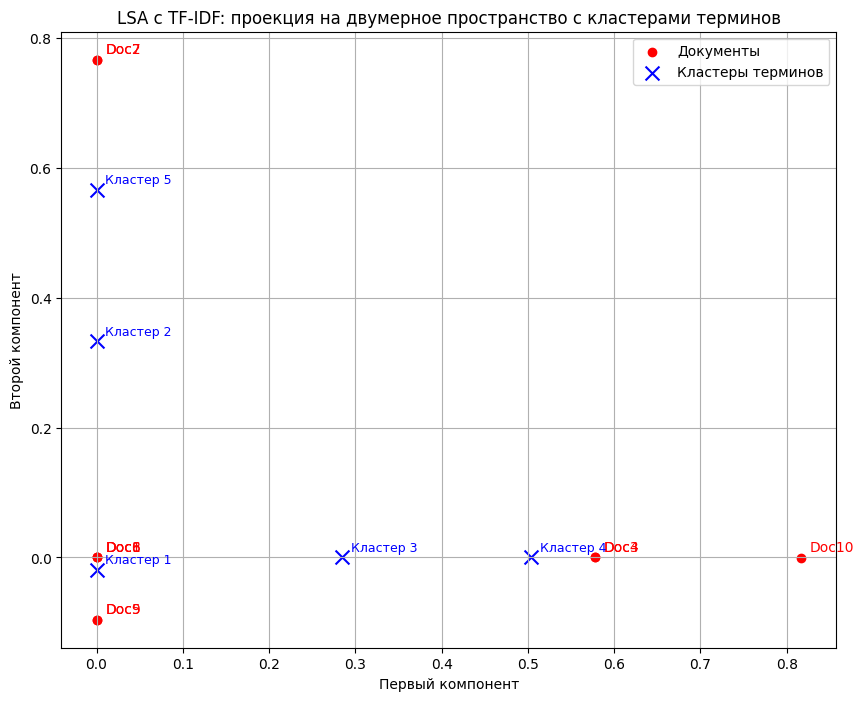

In [47]:
from sklearn.cluster import KMeans

# Определяем количество кластеров
num_clusters = 5

# Кластеризация терминов
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(term_coords_2d)
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Построение графика
plt.figure(figsize=(10, 8))

# Отображение документов
plt.scatter(doc_coords_2d[:, 0], doc_coords_2d[:, 1], marker='o', color='red', label='Документы')
for i, (x, y) in enumerate(doc_coords_2d):
    plt.text(x+0.01, y+0.01, f'Doc{i+1}', color='red')

# Отображение центроидов кластеров
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', color='blue', s=100, label='Кластеры терминов')
for i, (x, y) in enumerate(cluster_centers):
    plt.text(x+0.01, y+0.01, f'Кластер {i+1}', color='blue', fontsize=9)

plt.xlabel('Первый компонент')
plt.ylabel('Второй компонент')
plt.legend()
plt.title('LSA с TF-IDF: проекция на двумерное пространство с кластерами терминов')
plt.grid(True)
plt.show()

In [3]:
#!pip3 install stop_words

# Теперь используем SHAP values 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.metrics.pairwise import cosine_similarity

import shap
shap.initjs()

import re
import pymorphy2
from stop_words import get_stop_words

# Инициализация лемматизатора и стоп-слов
morph = pymorphy2.MorphAnalyzer()
russian_stopwords = get_stop_words('russian')

# Функция предобработки текста
def preprocess_text(text):
    text = re.sub(r'[^\w\s]', '', text.lower())
    words = text.split()
    words = [morph.parse(word)[0].normal_form for word in words if word not in russian_stopwords]
    return ' '.join(words)

# Заданные документы
documents = [
    "Мама мыла раму и окно.", # документ 1
    "Отец читал газету в кресле.", # документ 2
    "Собака лает на прохожих.", # документ 3
    "Кошка спит на подоконнике.", # документ 4
    "Дети играют в футбол на стадионе.", # документ 5
    "Мама готовит вкусный ужин.", # документ 6
    "Отец ремонтирует автомобиль в гараже.", # документ 7
    "Птицы поют на рассвете.", # документ 8
    "Дети смотрят мультфильмы по телевизору.", # документ 9
    "Собака и кошка дружат между собой." # документ 10
]

# Предобработка документов
processed_documents = [preprocess_text(doc) for doc in documents]

# Вывод предобработанных документов
for i, doc in enumerate(processed_documents):
    print(f"Документ {i+1}: {doc}")

# Создание TF-IDF матрицы
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(processed_documents)
terms = vectorizer.get_feature_names_out()

# Выбор целевого документа
target_doc_index = 9
target_tfidf = X[target_doc_index]

# Вычисление косинусного сходства
similarities = cosine_similarity(target_tfidf, X).flatten()
print("\nСходство с целевым документом:")
for i, sim in enumerate(similarities):
    print(f"Сходство между Док{target_doc_index+1} и Док{i+1}: {sim:.4f}")

Документ 1: мама мыло рама окно
Документ 2: отец читать газета кресло
Документ 3: собака лаять прохожий
Документ 4: кошка спать подоконник
Документ 5: ребёнок играть футбол стадион
Документ 6: мама готовить вкусный ужин
Документ 7: отец ремонтировать автомобиль гараж
Документ 8: птица петь рассвет
Документ 9: ребёнок смотреть мультфильм телевизор
Документ 10: собака кошка дружить

Сходство с целевым документом:
Сходство между Док10 и Док1: 0.0000
Сходство между Док10 и Док2: 0.0000
Сходство между Док10 и Док3: 0.2801
Сходство между Док10 и Док4: 0.2801
Сходство между Док10 и Док5: 0.0000
Сходство между Док10 и Док6: 0.0000
Сходство между Док10 и Док7: 0.0000
Сходство между Док10 и Док8: 0.0000
Сходство между Док10 и Док9: 0.0000
Сходство между Док10 и Док10: 1.0000



Коэффициенты модели:
        Термин   Коэффициент
9        лаять  1.274314e-01
17    прохожий  1.274314e-01
16  подоконник  1.274314e-01
25       спать  1.274314e-01
24      собака  1.083283e-01
7        кошка  1.083283e-01
5      дружить  1.474515e-17
1      вкусный -3.029692e-02
3        гараж -3.029692e-02
2       газета -3.029692e-02


/Users/alexrust/Library/Python/3.9/lib/python/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

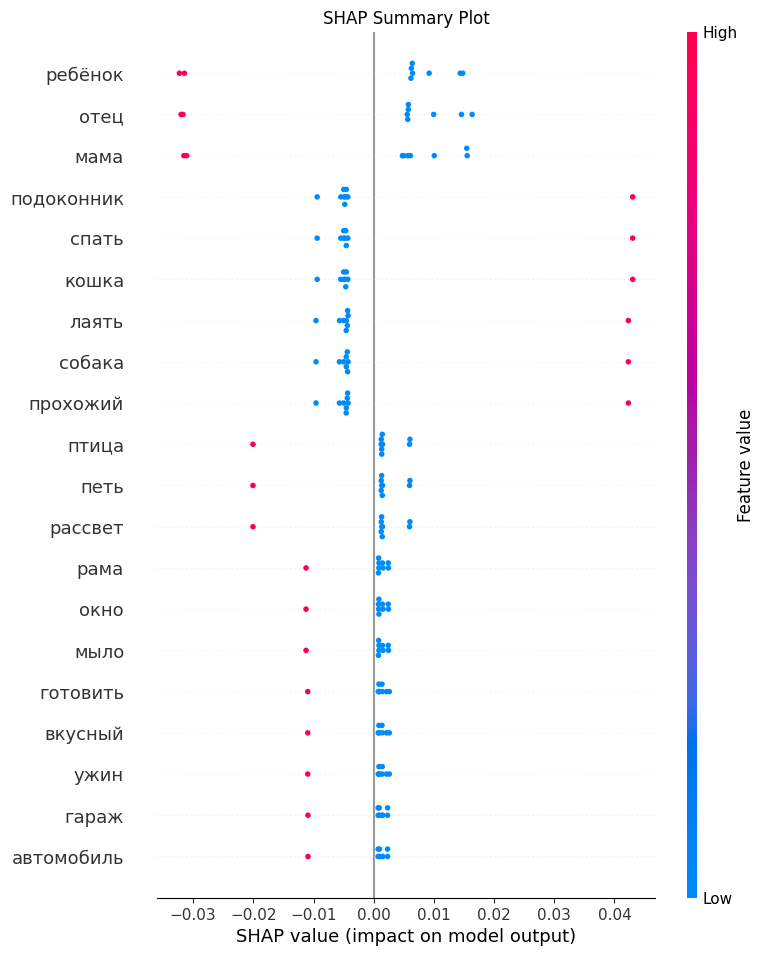

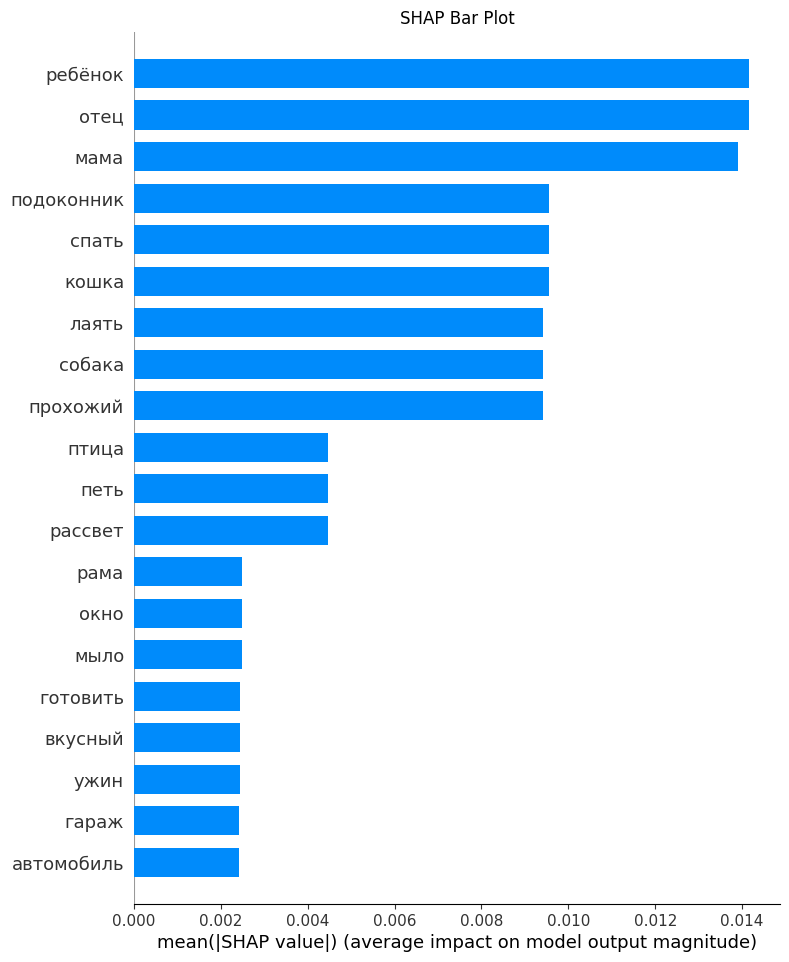

In [43]:
# Подготовка данных для обучения модели
X_train = np.delete(X.toarray(), target_doc_index, axis=0)
y_train = np.delete(similarities, target_doc_index, axis=0)
feature_names = vectorizer.get_feature_names_out()
X_train_df = pd.DataFrame(X_train, columns=feature_names)

# Обучение модели линейной регрессии
model = LinearRegression()
model.fit(X_train_df, y_train)

# Вывод коэффициентов модели
coef_df = pd.DataFrame({'Термин': feature_names, 'Коэффициент': model.coef_})
coef_df = coef_df.sort_values(by='Коэффициент', ascending=False)
print("\nКоэффициенты модели:")
print(coef_df.head(10))

# Создание SHAP Explainer
explainer = shap.LinearExplainer(model, X_train_df, feature_perturbation='correlation_dependent')

# Вычисление SHAP значений
shap_values = explainer.shap_values(X_train_df)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_train_df, feature_names=feature_names, show=False)
plt.title("SHAP Summary Plot")
plt.show()

# SHAP Bar Plot

shap.summary_plot(shap_values, X_train_df, feature_names=feature_names, plot_type='bar', show=False)
plt.title("SHAP Bar Plot")
plt.show()



Наиболее важный термин: лаять


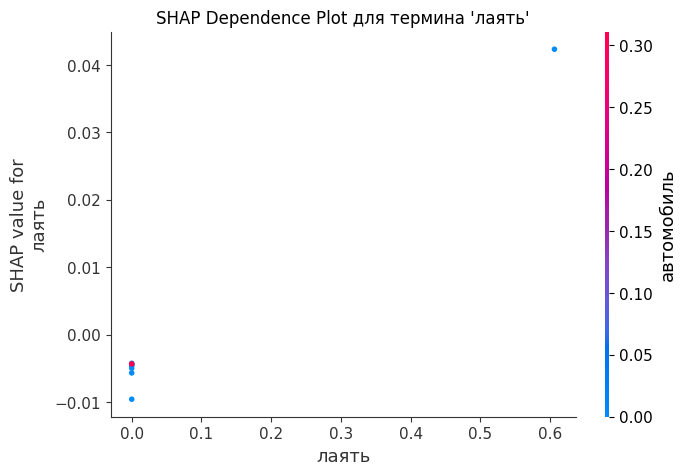

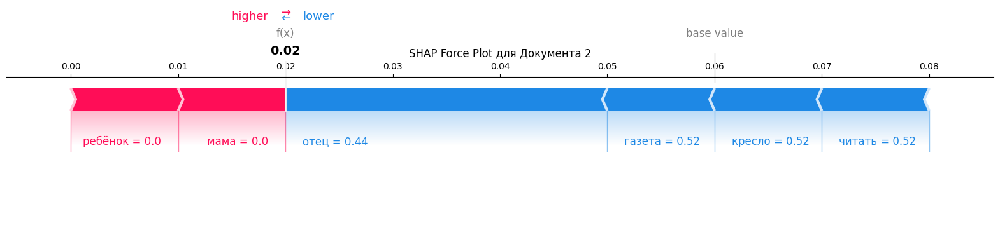

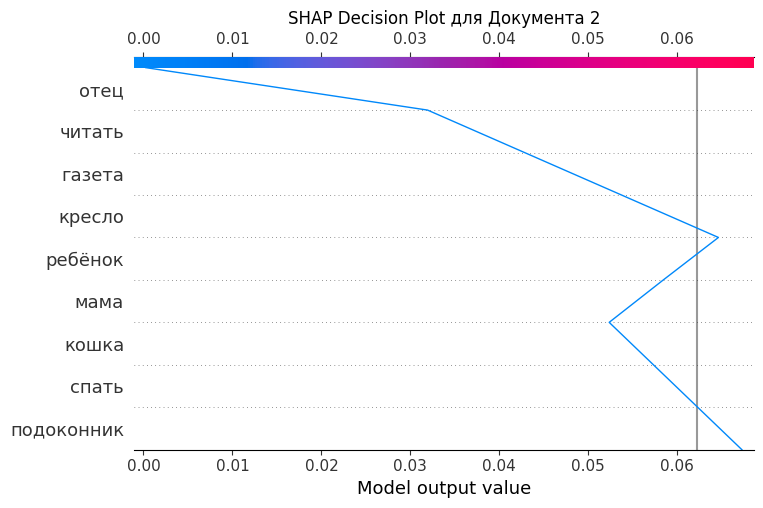

In [79]:
# Наиболее важный термин
top_term = coef_df.iloc[0]['Термин']
print(f"\nНаиболее важный термин: {top_term}")

# SHAP Dependence Plot
shap.dependence_plot(top_term, shap_values, X_train_df, feature_names=feature_names, show=False)
plt.title(f"SHAP Dependence Plot для термина '{top_term}'")
plt.show()

# Силовой график для отдельного предсказания
# Округление SHAP значений до 2 знаков после запятой
shap_values_rounded = np.round(shap_values, 2)
expected_value_rounded = np.round(explainer.expected_value, 2)

# Силовой график для отдельного предсказания
# Округляем данные
X_train_df_rounded = X_train_df.round(2)
shap_values_rounded = shap_values.round(2)

sample_index = 1
shap.force_plot(
   expected_value_rounded,
   shap_values_rounded[sample_index, :],
   X_train_df_rounded.iloc[sample_index, :],
   feature_names=feature_names,
   matplotlib=True,
   show=False
)
plt.title(f"SHAP Force Plot для Документа {sample_index + 1}")
plt.show()

# SHAP Decision Plot
shap.decision_plot(
    explainer.expected_value,
    shap_values[sample_index, :],
    feature_names=feature_names,
    feature_display_range=slice(None, -10, -1),
    show=False
)
plt.title(f"SHAP Decision Plot для Документа {sample_index + 1}")
plt.show()

In [12]:
#!pip install pymorphy2
#!pip install stop-words
#pip3 install --upgrade transformers
#!find ~ -name "venv" -type d
#!pip3 install sentence-transformers==2.2.0
# import transformers
# print(transformers.__version__)
#!pip3 install --upgrade transformers
#!pip3 install --upgrade sentence-transformers
print(sentence_transformers.__version__)  
print(sentence_transformers.__file__)

!pip3 uninstall sentence-transformers -y
!pip3 uninstall huggingface-hub -y

!pip3 install huggingface-hub==0.11.1
!pip3 install sentence-transformers==2.2.0
import sentence_transformers
print(sentence_transformers.__version__)  
print(sentence_transformers.__file__)
!which python3
!which pip3

4.0.2
/Users/alexrust/Library/Python/3.9/lib/python/site-packages/sentence_transformers/__init__.py
Found existing installation: sentence-transformers 2.2.0
Uninstalling sentence-transformers-2.2.0:
  Successfully uninstalled sentence-transformers-2.2.0
Found existing installation: huggingface-hub 0.30.1
Uninstalling huggingface-hub-0.30.1:
  Successfully uninstalled huggingface-hub-0.30.1
Defaulting to user installation because normal site-packages is not writeable
  Using cached huggingface_hub-0.11.1-py3-none-any.whl.metadata (7.5 kB)
Using cached huggingface_hub-0.11.1-py3-none-any.whl (182 kB)
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tokenizers 0.21.1 requires huggingface-hub<1.0,>=0.16.4, but you have huggingface-hub 0.11.1 which is i

# Теперь Добавляем трансформер для сравнения 

In [11]:
from sentence_transformers import SentenceTransformer

# Вывод предобработанных документов
for i, doc in enumerate(processed_documents):
    print(f"Документ {i+1}: {doc}")
    
# Используем модель SentenceTransformer
model_name = 'paraphrase-multilingual-MiniLM-L12-v2'  # Модель, поддерживающая русский язык
transformer_model = SentenceTransformer(model_name)

# Получение эмбеддингов для обработанных документов
embeddings = transformer_model.encode(processed_documents)

# Выбор целевого документа
target_doc_index = 9  # Документ 10

# Вычисление косинусного сходства между целевым документом и всеми остальными
transformer_similarities = cosine_similarity([embeddings[target_doc_index]], embeddings).flatten()

print("\nСходство с целевым документом (SentenceTransformer):")
for i, sim in enumerate(transformer_similarities):
    print(f"Сходство между Док{target_doc_index+1} и Док{i+1}: {sim:.4f}")

Документ 1: мама мыло рама окно
Документ 2: отец читать газета кресло
Документ 3: собака лаять прохожий
Документ 4: кошка спать подоконник
Документ 5: ребёнок играть футбол стадион
Документ 6: мама готовить вкусный ужин
Документ 7: отец ремонтировать автомобиль гараж
Документ 8: птица петь рассвет
Документ 9: ребёнок смотреть мультфильм телевизор
Документ 10: собака кошка дружить


NameError: name 'init_empty_weights' is not defined

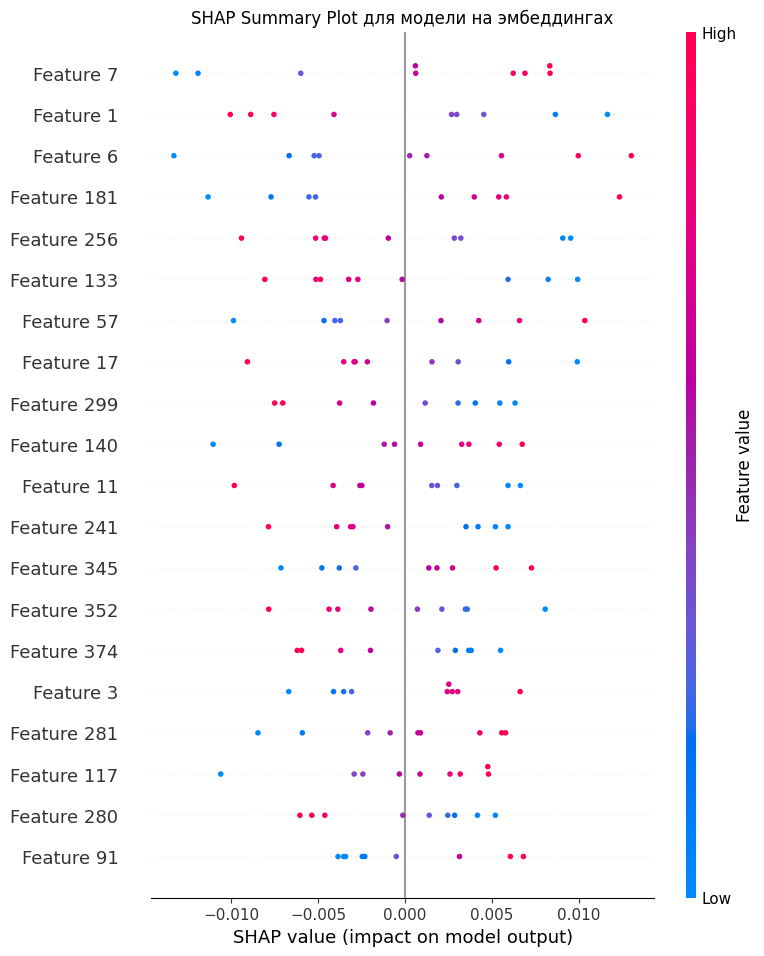

In [74]:

# Подготовка данных для линейной регрессии на эмбеддингах
X_train_embeddings = np.delete(embeddings, target_doc_index, axis=0)
y_train_embeddings = np.delete(transformer_similarities, target_doc_index, axis=0)

# Обучение модели линейной регрессии на эмбеддингах
embedding_model = LinearRegression()
embedding_model.fit(X_train_embeddings, y_train_embeddings)

# Получение коэффициентов (важность признаков)
feature_importance = embedding_model.coef_

# Используем SHAP для объяснения модели
explainer_emb = shap.LinearExplainer(embedding_model, X_train_embeddings)
shap_values_emb = explainer_emb.shap_values(X_train_embeddings)

# Создание DataFrame для SHAP значений
shap_df_emb = pd.DataFrame(shap_values_emb, columns=[f"dim_{i}" for i in range(embeddings.shape[1])])

# SHAP Summary Plot для модели на эмбеддингах
shap.summary_plot(shap_values_emb, X_train_embeddings, show=False)
plt.title("SHAP Summary Plot для модели на эмбеддингах")
plt.show()

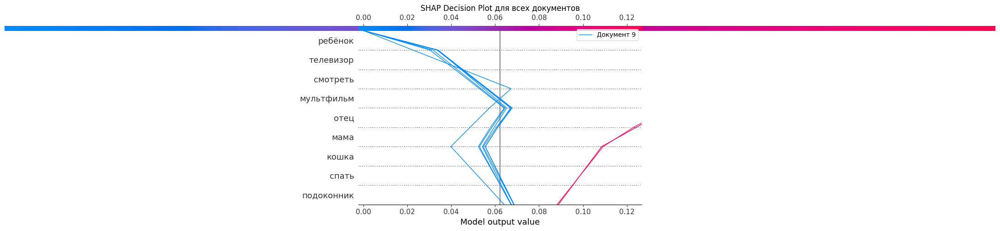

In [82]:
# SHAP Decision Plot для всех документов
plt.figure(figsize=(10, 6))
for i in range(X_train_df.shape[0]):
    shap.decision_plot(
        explainer.expected_value,
        shap_values[i, :],
        feature_names=feature_names,
        feature_display_range=slice(None, -10, -1),
        legend_labels=[f"Документ {i+1}" if i < target_doc_index else f"Документ {i+2}"],
        show=False
    )
plt.title("SHAP Decision Plot для всех документов")
plt.show()

           Термин   Коэффициент
25          спать  1.274314e-01
16     подоконник  1.274314e-01
17       прохожий  1.274314e-01
9           лаять  1.274314e-01
24         собака  1.083283e-01
7           кошка  1.083283e-01
5         дружить  3.295975e-16
0      автомобиль -3.029692e-02
2          газета -3.029692e-02
28           ужин -3.029692e-02
26        стадион -3.029692e-02
29         футбол -3.029692e-02
19           рама -3.029692e-02
12           мыло -3.029692e-02
13           окно -3.029692e-02
11     мультфильм -3.029692e-02
23       смотреть -3.029692e-02
27      телевизор -3.029692e-02
1         вкусный -3.029692e-02
8          кресло -3.029692e-02
30         читать -3.029692e-02
4        готовить -3.029692e-02
22  ремонтировать -3.029692e-02
6          играть -3.029692e-02
3           гараж -3.029692e-02
20        рассвет -4.030079e-02
18          птица -4.030079e-02
15           петь -4.030079e-02
21        ребёнок -5.151030e-02
10           мама -5.151030e-02
14      

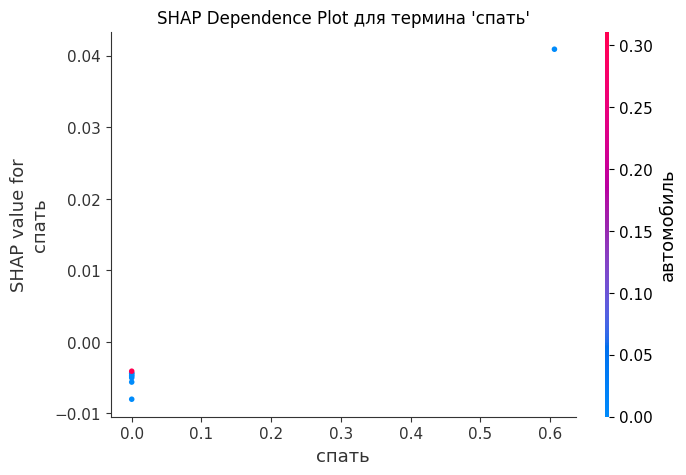

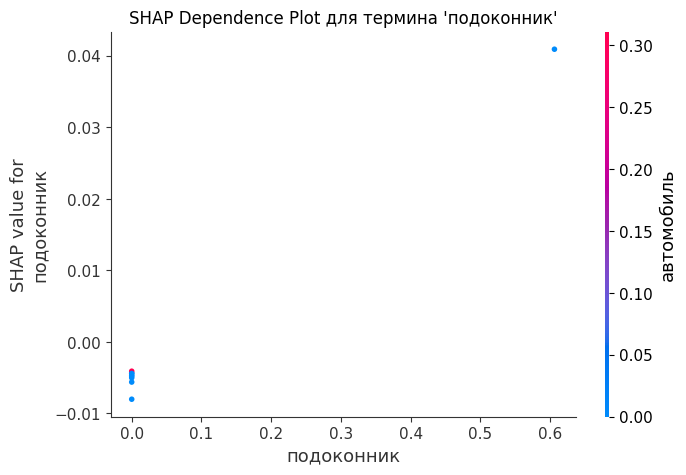

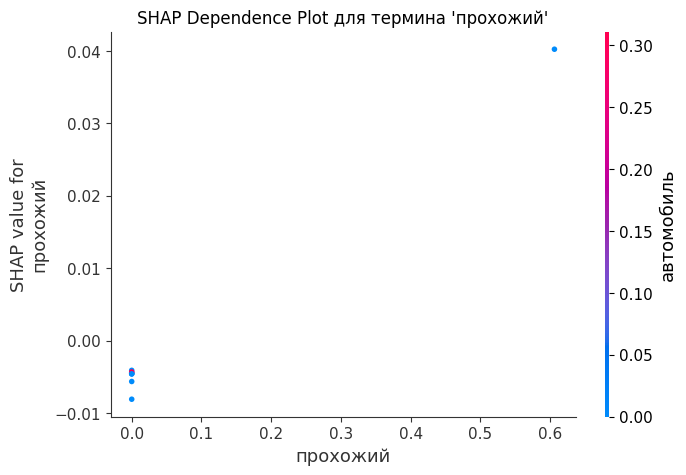

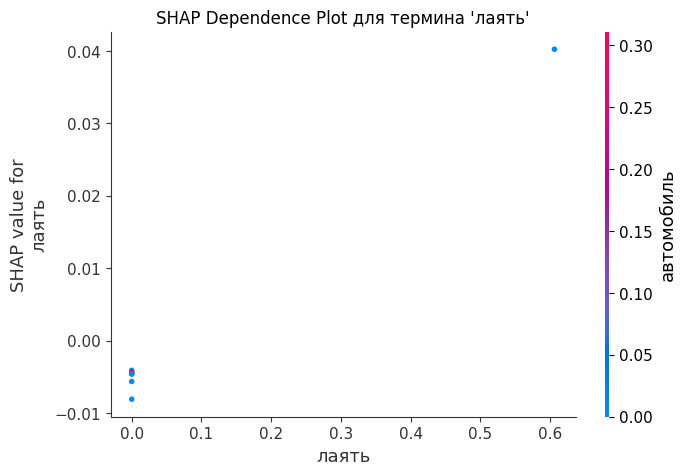

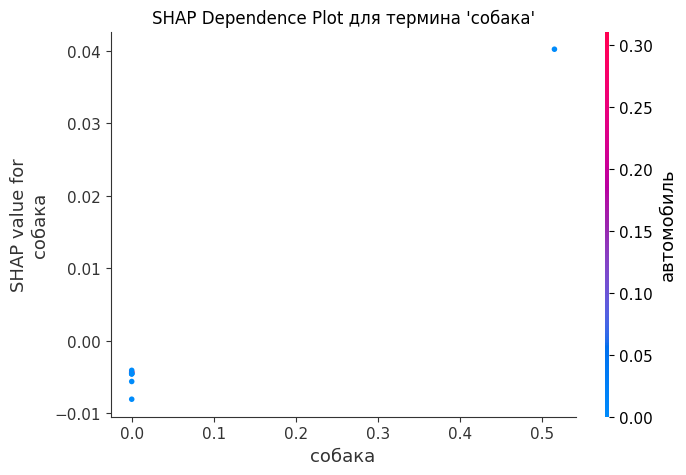

In [96]:
# Выбираем топ-5 терминов
print(coef_df)
top_terms = coef_df['Термин'].head(5).tolist()

for term in top_terms:
    shap.dependence_plot(term, shap_values, X_train_df, feature_names=feature_names, show=False)
    plt.title(f"SHAP Dependence Plot для термина '{term}'")
    plt.show()

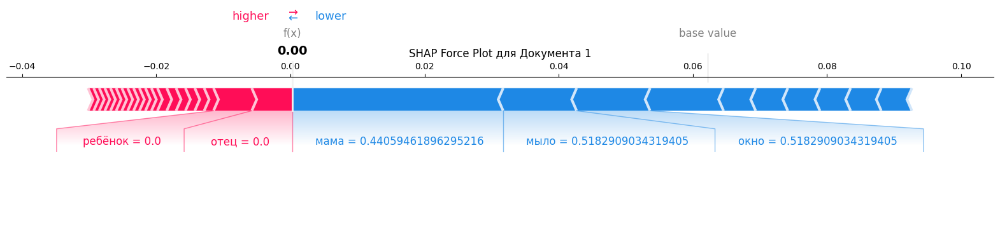

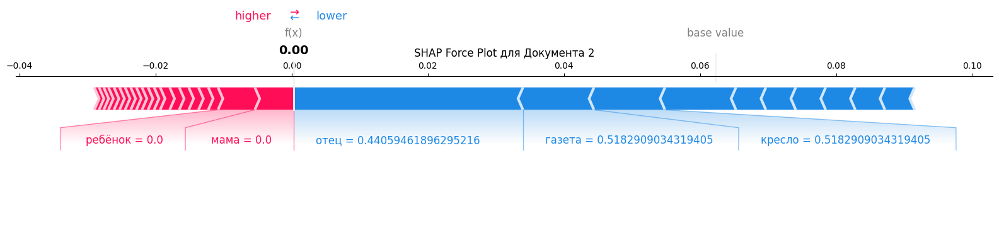

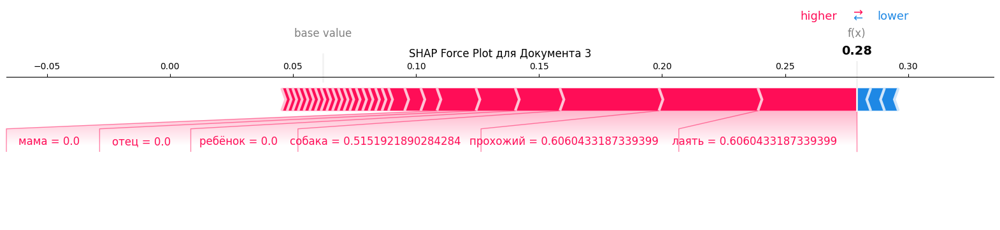

In [84]:
# SHAP Force Plot для нескольких документов
for sample_index in range(3):  # Первые три документа
    shap.force_plot(
        explainer.expected_value,
        shap_values[sample_index, :],
        X_train_df.iloc[sample_index, :],
        feature_names=feature_names,
        matplotlib=True,
        show=False
    )
    plt.title(f"SHAP Force Plot для Документа {sample_index + 1}")
    plt.show()

In [85]:
# Импортируем дополнительный модуль для текстовых визуализаций
from shap import TextExplainer

for i in range(3):  # Для первых трех документов
    te = TextExplainer()
    te.fit(processed_documents[i], lambda x: model.predict(vectorizer.transform([x]))[0])
    te_vals = te.shap_values()
    shap.plots.text(te)

ImportError: cannot import name 'TextExplainer' from 'shap' (/Users/alexrust/Library/Python/3.8/lib/python/site-packages/shap/__init__.py)

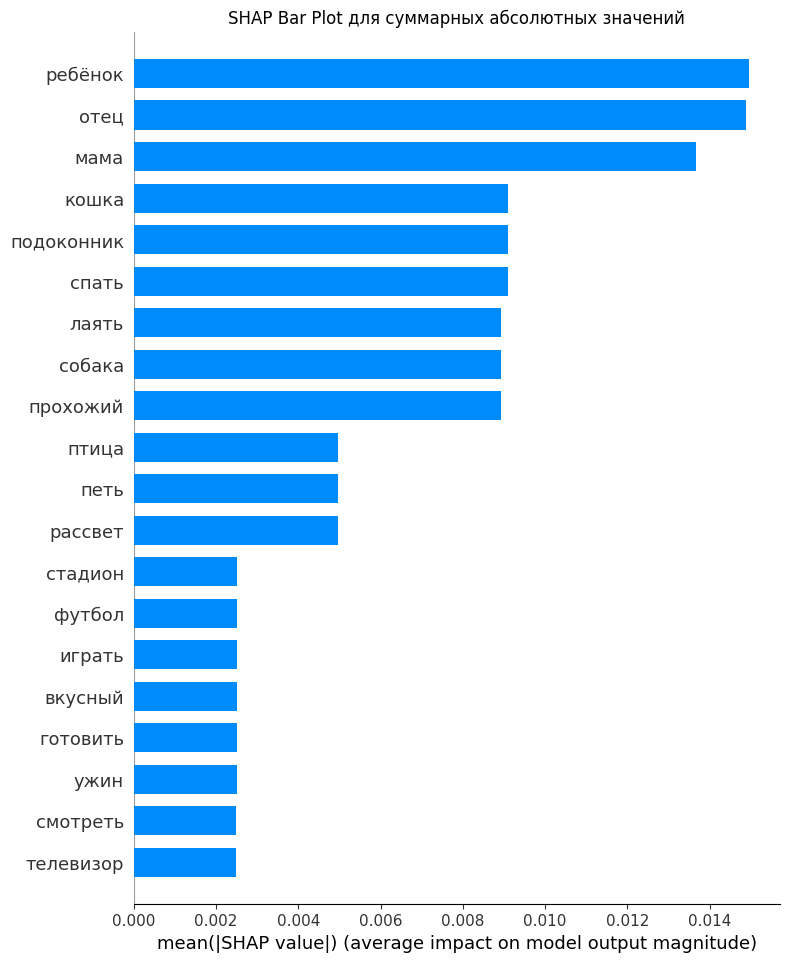

In [98]:
# SHAP Bar Plot для суммарных абсолютных SHAP значений
shap.summary_plot(shap_values, X_train_df, plot_type='bar', show=False)
plt.title("SHAP Bar Plot для суммарных абсолютных значений")
plt.show()

In [100]:
shap.plots.bar(shap_values)

TypeError: The shap_values argument must be an Explanation object, Cohorts object, or dictionary of Explanation objects!

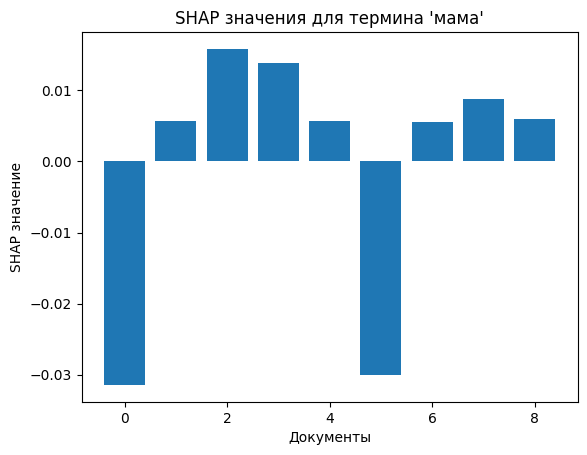

In [87]:
# Выбираем конкретное слово из наших терминов
specific_term = 'мама'  # Например, слово 'мама'

# Получаем индексы документов, содержащих слово
term_index = feature_names.tolist().index(specific_term)

# SHAP Bar Plot для конкретного слова
shap_values_for_term = shap_values[:, term_index]
plt.bar(range(len(shap_values_for_term)), shap_values_for_term)
plt.xlabel('Документы')
plt.ylabel('SHAP значение')
plt.title(f"SHAP значения для термина '{specific_term}'")
plt.show()

In [101]:
# Предположим, что у вас есть обученная модель и векторизатор
# model - ваша модель (например, LogisticRegression)
# vectorizer - ваш CountVectorizer или TfidfVectorizer
# texts - список ваших текстовых документов

# Создаем объяснитель
explainer = shap.Explainer(model.predict, vectorizer.transform, feature_names=vectorizer.get_feature_names_out())

# Вычисляем SHAP значения
shap_values = explainer(texts)

# Визуализируем SHAP значения для каждого документа
for i in range(len(texts)):
    shap.plots.text(shap_values[i])

AttributeError: 'Text' object has no attribute 'shape'

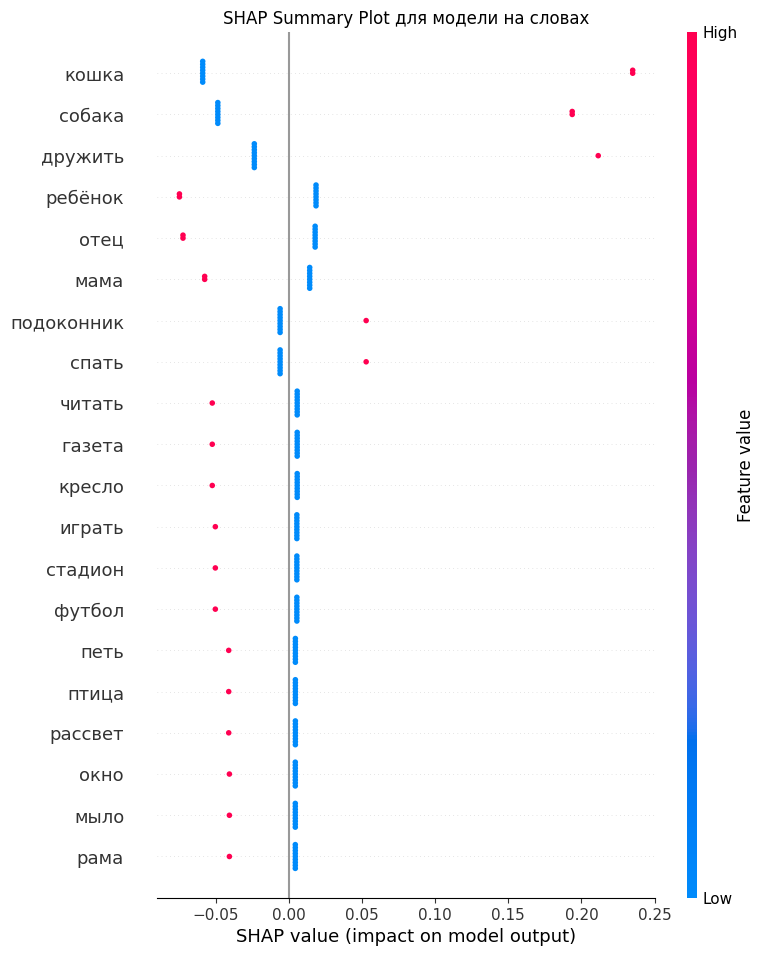

In [103]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LinearRegression
import shap

# Создание векторизатора
vectorizer = CountVectorizer()
X_bow = vectorizer.fit_transform(processed_documents)

# Преобразование матрицы в плотный формат (если необходимо)
X_bow_dense = X_bow.toarray()

# Целевые значения (косинусное сходство с целевым документом)
y_similarity = transformer_similarities

# Обучение линейной регрессии на BoW признаках
model_bow = LinearRegression()
model_bow.fit(X_bow_dense, y_similarity)

# Получение имен признаков (слов)
feature_names = vectorizer.get_feature_names_out()

# Использование SHAP для объяснения модели
explainer_bow = shap.LinearExplainer(model_bow, X_bow_dense)
shap_values_bow = explainer_bow.shap_values(X_bow_dense)

# Создание DataFrame для SHAP значений с именами признаков
shap_df_bow = pd.DataFrame(shap_values_bow, columns=feature_names)

# SHAP Summary Plot для модели на словах
shap.summary_plot(shap_values_bow, X_bow_dense, feature_names=feature_names, show=False)
plt.title("SHAP Summary Plot для модели на словах")
plt.show()


In [107]:
import shap

# Определяем функцию, которая принимает список текстов и возвращает сходство с целевым документом
def similarity_function(texts):
    # Преобразуем тексты в эмбеддинги
    embeddings = transformer_model.encode(texts)
    # Вычисляем косинусное сходство с целевым документом
    target_embedding = embeddings[target_doc_index]
    similarities = cosine_similarity([target_embedding], embeddings).flatten()
    return similarities

# Создаем объяснитель SHAP для текстовой модели
explainer = shap.Explainer(similarity_function, masker=shap.maskers.Text(tokenizer='word'))

# Выбираем текст, для которого хотим получить объяснение (например, документ 5)
text_to_explain = [processed_documents[4]]  # Документ 5

# Получаем SHAP значения
shap_values = explainer(text_to_explain)

# Визуализируем SHAP значения
shap.plots.text(shap_values[0])
   

IndexError: index 9 is out of bounds for axis 0 with size 1

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import shap

# Загружаем модель и токенизатор BERT
model_name = 'bert-base-multilingual-cased'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

# Определяем функцию предсказания
def predict(texts):
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    outputs = model(**inputs)
    # Получаем вероятности класса
    probs = outputs.logits.softmax(dim=1).detach().numpy()
    return probs

In [110]:
# Создаем объяснитель SHAP
explainer = shap.Explainer(predict, masker=shap.maskers.Text(tokenizer))

# Выбираем текст для объяснения
text_to_explain = processed_documents[4]  # Документ 5

# Получаем SHAP значения
shap_values = explainer([text_to_explain])

# Визуализируем SHAP значения


shap.plots.text(shap_values[0])

ValueError: text input must be of type `str` (single example), `List[str]` (batch or single pretokenized example) or `List[List[str]]` (batch of pretokenized examples).


Сходство с целевым документом:
Сходство между Док10 и Док1: 0.0000
Сходство между Док10 и Док2: 0.0000
Сходство между Док10 и Док3: 0.2236
Сходство между Док10 и Док4: 0.2236
Сходство между Док10 и Док5: 0.0000
Сходство между Док10 и Док6: 0.0000
Сходство между Док10 и Док7: 0.0000
Сходство между Док10 и Док8: 0.0000
Сходство между Док10 и Док9: 0.0000
Сходство между Док10 и Док10: 1.0000


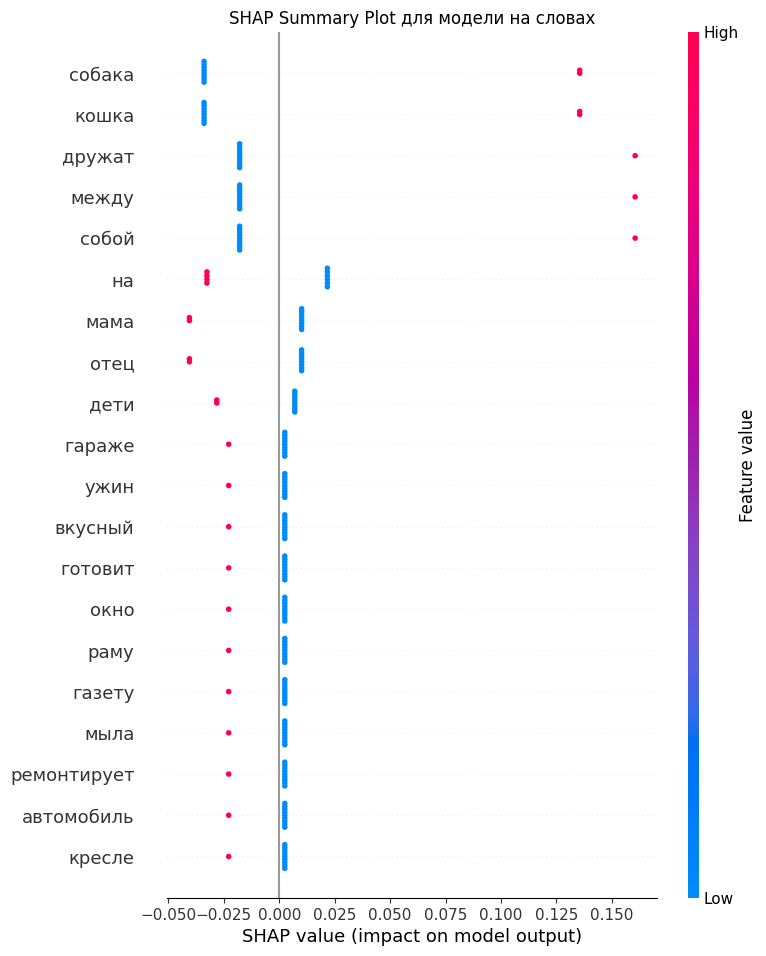

In [109]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.metrics.pairwise import cosine_similarity
import shap

# Ваши документы
documents = [
    "Мама мыла раму и окно.",
    "Отец читал газету в кресле.",
    "Собака лает на прохожих.",
    "Кошка спит на подоконнике.",
    "Дети играют в футбол на стадионе.",
    "Мама готовит вкусный ужин.",
    "Отец ремонтирует автомобиль в гараже.",
    "Птицы поют на рассвете.",
    "Дети смотрят мультфильмы по телевизору.",
    "Собака и кошка дружат между собой."
]

# Предобработка документов (может включать лемматизацию и т.д.)
processed_documents = [doc.lower() for doc in documents]

# Создаем векторизатор
vectorizer = CountVectorizer()
X_bow = vectorizer.fit_transform(processed_documents)

# Вычисляем косинусное сходство между целевым документом и всеми остальными
target_doc_index = 9  # Документ 10
cos_similarities = cosine_similarity(X_bow[target_doc_index], X_bow).flatten()

print("\nСходство с целевым документом:")
for i, sim in enumerate(cos_similarities):
    print(f"Сходство между Док{target_doc_index+1} и Док{i+1}: {sim:.4f}")

# Подготовка данных для линейной регрессии
X_train_bow = X_bow.toarray()
y_train_similarity = cos_similarities

# Обучение линейной регрессии на BoW признаках
model_bow = LinearRegression()
model_bow.fit(X_train_bow, y_train_similarity)

# Использование SHAP для объяснения модели
explainer_bow = shap.LinearExplainer(model_bow, X_train_bow)
shap_values_bow = explainer_bow.shap_values(X_train_bow)

# Получение имен признаков (слов)
feature_names = vectorizer.get_feature_names_out()

# SHAP Summary Plot для модели на словах
shap.summary_plot(shap_values_bow, X_train_bow, feature_names=feature_names, show=False)
plt.title("SHAP Summary Plot для модели на словах")
plt.show()

# Визуализация SHAP значений для конкретного документа
shap.initjs()
shap.force_plot(explainer_bow.expected_value, shap_values_bow[target_doc_index], feature_names=feature_names)

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import shap
import numpy as np
import pandas as pd

model_name = 'nlptown/bert-base-multilingual-uncased-sentiment'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)

def predict(texts):
    # Преобразование типов данных
    if isinstance(texts, np.ndarray):
        texts = texts.tolist()
    elif isinstance(texts, pd.Series):
        texts = texts.tolist()
    elif not isinstance(texts, list):
        texts = [texts]
    texts = [str(text) for text in texts]
    # Токенизация и предсказание
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)
    outputs = model(**inputs)
    probs = outputs.logits.softmax(dim=1).detach().numpy()
    return probs

# Создание объяснителя SHAP
explainer = shap.Explainer(predict, masker=shap.maskers.Text(tokenizer))

In [113]:
# Текст для объяснения
text_to_explain = processed_documents[9] 

# Получение SHAP значений
shap_values = explainer([text_to_explain])

# Визуализация SHAP значений
shap.plots.text(shap_values[0])

  0%|          | 0/182 [00:00<?, ?it/s]


artitionExplainer explainer: 2it [00:17, 17.84s/it]                            

In [114]:
text_to_explain

'собака и кошка дружат между собой.'

In [95]:
# from sentence_transformers import SentenceTransformer
# from sklearn.metrics.pairwise import cosine_similarity

# # Предположим, вы уже обработали ваши документы и получили их список
# processed_documents = [
#     "Это первый документ.",
#     "А это второй документ.",
#     # Добавьте остальные документы сюда
# ]

# # Вывод предобработанных документов
# for i, doc in enumerate(processed_documents):
#     print(f"Документ {i+1}: {doc}")

# # Проверяем, что модель загружается корректно
# model_name = 'all-mpnet-base-v2'
# try:
#     transformer_model = SentenceTransformer(model_name)
# except Exception as e:
#     print(f"Ошибка загрузки модели: {e}")
#     raise

# # Получение эмбеддингов для обработанных документов
# embeddings = transformer_model.encode(processed_documents)

# # Выбор целевого документа
# target_doc_index = 1  # Убедитесь, что индекс существует
# if target_doc_index >= len(processed_documents):
#     raise IndexError("Индекс целевого документа превышает длину списка документов.")

# # Вычисление косинусного сходства между целевым документом и всеми остальными
# transformer_similarities = cosine_similarity([embeddings[target_doc_index]], embeddings).flatten()

# print("\nСходство с целевым документом (SentenceTransformer):")
# for i, sim in enumerate(transformer_similarities):
#     print(f"Сходство между Док{target_doc_index+1} и Док{i+1}: {sim:.4f}")

Документ 1: Это первый документ.
Документ 2: А это второй документ.


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.4k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

Ошибка загрузки модели: name 'init_empty_weights' is not defined


NameError: name 'init_empty_weights' is not defined

In [4]:
#!pip3 install sentence-transformers transformers torch


# Объединение моделей (иллюстрация 10, 630 тыс. и 120 тыс. текстов)
## 1. Тестовые 10 текстов

In [146]:
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score
from textblob import TextBlob

# Пример небольшого корпуса с тремя тематиками: спорт, политика, технологии
documents = [
    "The team won the championship after scoring a goal in the final minute.",
    "The final match ended in a draw with both teams scoring one goal each.",
    "A substitution was made in the second half to improve the attack performance.",
    "The government passed a new healthcare reform law to improve services.",
    "The president addressed the nation about new education policies.",
    "Election results were announced after counting the majority of votes.",
    "The tech company unveiled its latest smartphone model with improved battery life.",
    "Engineers developed a new algorithm that boosts data processing speed.",
    "The software update includes new features and security patches."
]
# Истинные метки тем (для примера, они не используются в обучении)
labels = ["sports", "sports", "sports",
          "politics", "politics", "politics",
          "tech", "tech", "tech"]

# TF-IDF векторизация документов
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(documents).toarray()

# Обучим простой классификатор (лог. регрессия) на TF-IDF для имитации задачи классификации
# Разделим данные на тренировочные и тестовые индексы для обучения классификатора
train_idx = [0,1,3,4,6,7]  # 2 doc в каждой теме для обучения
test_idx  = [2,5,8]        # по 1 doc для теста
X_train = X[train_idx];    y_train = [labels[i] for i in train_idx]
X_test  = X[test_idx];     y_test  = [labels[i] for i in test_idx]

clf = LogisticRegression(max_iter=1000)
clf.fit(X_train, y_train)
# Предскажем метки на обучающей выборке (для дальнейших фичей)
y_train_pred = clf.predict(X_train)

# Кластеризация (K-Means на всех документах, 3 кластера)
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
cluster_labels = kmeans.labels_

# Сентимент-анализ: используем TextBlob для оценки полярности каждого документа (эмациональная окраска от -1 до 1))
sentiments = [TextBlob(doc).sentiment.polarity for doc in documents]

# Собираем пары документов (тренировочные) для оценки схожести как классификации
train_pairs = []
train_pair_labels = []
# Положительные пары: из одной темы (горизонтально)
for cls in set(labels):
    idxs = [i for i,l in enumerate(labels) if l==cls and i in train_idx]
    if len(idxs) > 1:
        for i in range(len(idxs)):
            for j in range(i+1,len(idxs)):
                train_pairs.append((idxs[i], idxs[j]))
                train_pair_labels.append(1)
# Отрицательные пары: из разных тем
train_classes = list(set(labels))
for i in range(len(train_classes)):
    for j in range(i+1, len(train_classes)):
        idxs1 = [k for k,l in enumerate(labels) if l==train_classes[i] and k in train_idx]
        idxs2 = [k for k,l in enumerate(labels) if l==train_classes[j] and k in train_idx]
        for a in idxs1:
            for b in idxs2:
                train_pairs.append((a, b))
                train_pair_labels.append(0)

# Функция для вычисления признаков пары (косинус, сентимент, кластер, классификация)
def pair_features(pair):
    i,j = pair
    cos = cosine_similarity([X[i]], [X[j]])[0][0]
    sent_sim = 1 - abs(sentiments[i] - sentiments[j])
    cluster_same = 1 if cluster_labels[i]==cluster_labels[j] else 0
    class_same = 1 if (clf.predict([X[i]])[0] == clf.predict([X[j]])[0]) else 0
    return cos, sent_sim, cluster_same, class_same

# Построим признаки для всех пар
features = np.array([pair_features(pair) for pair in train_pairs])
y = np.array(train_pair_labels)

# Оценим модели на разных наборах признаков
def eval_model(X_feat):
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X_feat, y)
    y_pred = model.predict(X_feat)
    return precision_score(y, y_pred), recall_score(y, y_pred), f1_score(y, y_pred)

# Модель 1: только косинус
p1, r1, f1 = eval_model(features[:, [0]])
# Модель 2: косинус + сентимент
p2, r2, f2 = eval_model(features[:, [0,1]])
# Модель 3: косинус + кластер
p3, r3, f3 = eval_model(features[:, [0,2]])
# Модель 4: косинус + классификация
p4, r4, f4 = eval_model(features[:, [0,3]])
# Модель 5: все признаки вместе
p5, r5, f5 = eval_model(features)

print("Precision:", p1, p2, p3, p4, p5)
print("Recall:   ", r1, r2, r3, r4, r5)
print("F1-score: ", f1, f2, f3, f4, f5)

Precision: 0.6666666666666666 0.4 0.2727272727272727 1.0 1.0
Recall:    0.6666666666666666 0.6666666666666666 1.0 1.0 1.0
F1-score:  0.6666666666666666 0.5 0.42857142857142855 1.0 1.0


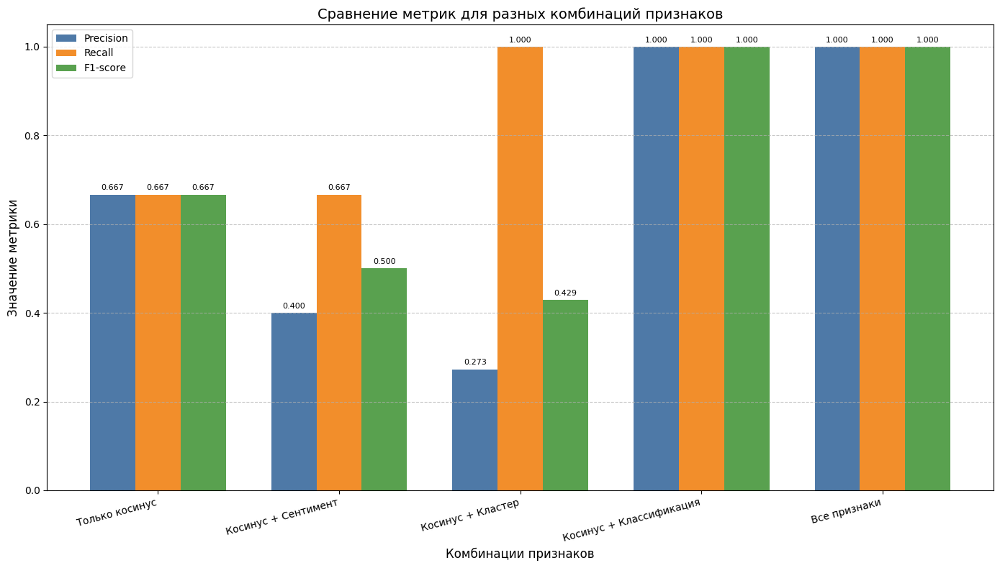

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Результаты метрик из кода
precisions = [p1, p2, p3, p4, p5]
recalls = [r1, r2, r3, r4, r5]
f1_scores = [f1, f2, f3, f4, f5]

# Описание моделей
model_names = [
    'Только косинус', 
    'Косинус + Сентимент', 
    'Косинус + Кластер', 
    'Косинус + Классификация', 
    'Все признаки'
]

# Настройка позиций столбцов
x = np.arange(len(model_names))
width = 0.25  # Ширина столбца

# Создание группированного графика
fig, ax = plt.subplots(figsize=(14, 8))

# Столбцы для каждой метрики
rects1 = ax.bar(x - width, precisions, width, label='Precision', color='#4e79a7')
rects2 = ax.bar(x, recalls, width, label='Recall', color='#f28e2b')
rects3 = ax.bar(x + width, f1_scores, width, label='F1-score', color='#59a14f')

# Добавление подписей
ax.set_ylabel('Значение метрики', fontsize=12)
ax.set_xlabel('Комбинации признаков', fontsize=12)
ax.set_title('Сравнение метрик для разных комбинаций признаков', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(model_names, rotation=15, ha='right', fontsize=10)
ax.legend(fontsize=10)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Добавление значений на столбцы
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.3f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # Смещение по вертикали
                    textcoords="offset points",
                    ha='center', va='bottom',
                    fontsize=8)

autolabel(rects1)
autolabel(rects2)
autolabel(rects3)

plt.tight_layout()
plt.show()

In [27]:
#!pip install datasets

## 2 Dbpedia 630 тыс. текстов 14 классов

### 2.1. HashingVectorizer, MiniBatchKMeans, SGDClassifier, SentimentIntensityAnalyzer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/alexrust/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Loaded 630000 docs in 20.4s


Training: 100%|██████████| 126/126 [00:31<00:00,  4.04it/s]


Batch training done in 31.2s
Prepared sample in 1.9s
Generated 19972 pairs in 0.8s
Built features in 0.0s
Evaluation done in 0.1s


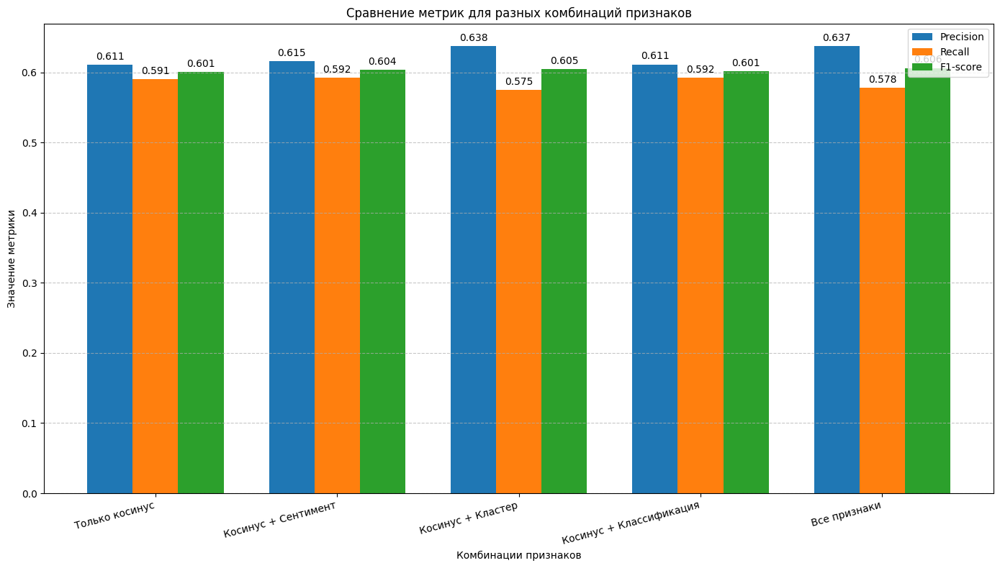

In [ ]:
import time
import os
import numpy as np
import nltk
from datasets import load_dataset
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.cluster import MiniBatchKMeans
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.preprocessing import normalize
from sklearn.metrics import precision_score, recall_score, f1_score
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm import tqdm
import matplotlib.pyplot as plt

# 0. Скачиваем VADER
nltk.download('vader_lexicon')

# 1. Загрузим корпус
t0 = time.perf_counter()
dataset = load_dataset('dbpedia_14')
texts   = list(dataset['train']['content']) + list(dataset['test']['content'])
labels  = list(dataset['train']['label'])   + list(dataset['test']['label'])
print(f"Loaded {len(texts)} docs in {time.perf_counter()-t0:.1f}s")

# 2. Инициализация
vectorizer = HashingVectorizer(n_features=2**20, alternate_sign=False, norm='l2', lowercase=True)
kmeans     = MiniBatchKMeans(n_clusters=20, batch_size=10000, random_state=42)
sgd_clf    = SGDClassifier(loss='log_loss', max_iter=5, tol=None, random_state=42)
sia        = SentimentIntensityAnalyzer()

# 3. Partial fit по батчам
batch_size = 5000
n_samples  = len(texts)
classes    = np.unique(labels)

t1 = time.perf_counter()
for start in tqdm(range(0, n_samples, batch_size), desc="Training"):
    end = min(start + batch_size, n_samples)
    Xb = vectorizer.transform(texts[start:end])
    kmeans.partial_fit(Xb)
    if start == 0:
        sgd_clf.partial_fit(Xb, labels[start:end], classes=classes)
    else:
        sgd_clf.partial_fit(Xb, labels[start:end])
print(f"Batch training done in {time.perf_counter()-t1:.1f}s")

# 4. Подвыборка
t2 = time.perf_counter()
sample_size = min(10000, n_samples)
idxs        = np.random.choice(n_samples, sample_size, replace=False)
X_sample    = vectorizer.transform([texts[i] for i in idxs])
X_norm      = normalize(X_sample, norm='l2', axis=1)
clusters    = kmeans.predict(X_sample)
sents       = np.array([sia.polarity_scores(texts[i])['compound'] for i in idxs])
pred_class  = sgd_clf.predict(X_sample)
true_labels = np.array([labels[i] for i in idxs])
print(f"Prepared sample in {time.perf_counter()-t2:.1f}s")

# 5. Генерация пар
t3 = time.perf_counter()
pairs, y = [], []
for cls in classes:
    cls_idx = np.where(true_labels == cls)[0]
    for a, b in zip(cls_idx[:-1], cls_idx[1:]):
        pairs.append((int(a), int(b))); y.append(1)
pos_count = len(y)
neg_needed = pos_count
total = pos_count + neg_needed
while len(y) < total:
    a, b = np.random.choice(sample_size, 2, False)
    if true_labels[a] != true_labels[b]:
        pairs.append((int(a), int(b))); y.append(0)
print(f"Generated {len(pairs)} pairs in {time.perf_counter()-t3:.1f}s")

# 6. Признаки
t4 = time.perf_counter()
I = np.array([p[0] for p in pairs])
J = np.array([p[1] for p in pairs])
cosine      = np.sum(X_norm[I].multiply(X_norm[J]), axis=1).A1
sent_sim    = 1 - np.abs(sents[I] - sents[J])
cluster_same = (clusters[I] == clusters[J]).astype(int)
class_same   = (pred_class[I] == pred_class[J]).astype(int)
Xp = np.vstack([cosine, sent_sim, cluster_same, class_same]).T
yp = np.array(y)
print(f"Built features in {time.perf_counter()-t4:.1f}s")

# 7. Обучение и сбор метрик
t5 = time.perf_counter()
feature_sets = {
    'Только косинус':            [0],
    'Косинус + Сентимент':      [0,1],
    'Косинус + Кластер':        [0,2],
    'Косинус + Классификация':  [0,3],
    'Все признаки':             [0,1,2,3],
}
results = {}
for name, cols in feature_sets.items():
    if len(np.unique(yp)) < 2:
        results[name] = (np.nan, np.nan, np.nan)
    else:
        Xf = Xp[:, cols]
        model = LogisticRegression(max_iter=1000, class_weight='balanced')
        model.fit(Xf, yp)
        yp_pred = model.predict(Xf)
        results[name] = (
            precision_score(yp, yp_pred),
            recall_score(yp, yp_pred),
            f1_score(yp, yp_pred)
        )
print(f"Evaluation done in {time.perf_counter()-t5:.1f}s")

# 8. Визуализация результатов
model_names = list(feature_sets.keys())
precisions = [results[m][0] for m in model_names]
recalls    = [results[m][1] for m in model_names]
f1_scores  = [results[m][2] for m in model_names]

x = np.arange(len(model_names))
width = 0.25

fig, ax = plt.subplots(figsize=(14, 8))
rects1 = ax.bar(x - width, precisions, width, label='Precision')
rects2 = ax.bar(x,         recalls,    width, label='Recall')
rects3 = ax.bar(x + width, f1_scores,  width, label='F1-score')

ax.set_ylabel('Значение метрики')
ax.set_xlabel('Комбинации признаков')
ax.set_title('Сравнение метрик для разных комбинаций признаков')
ax.set_xticks(x)
ax.set_xticklabels(model_names, rotation=15, ha='right')
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.7)

for rect in rects1 + rects2 + rects3:
    h = rect.get_height()
    ax.annotate(f'{h:.3f}',
                xy=(rect.get_x()+rect.get_width()/2, h),
                xytext=(0,3), textcoords='offset points',
                ha='center', va='bottom')

plt.tight_layout()
plt.show()


# 3. AG News, ~120k примеров


## 3.1 TF-IDF, лог.регрессия, KMeans, TextBlob (Сентимент-анализ)

In [ ]:
import time
import numpy as np
from datasets import load_dataset
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score
from textblob import TextBlob
from sklearn.model_selection import train_test_split
from tqdm import tqdm

t1 = time.perf_counter()
# 1. Загрузка большого датасета (AG News, ~120k примеров)
dataset = load_dataset('ag_news')
texts = list(dataset['train']['text']) + list(dataset['test']['text'])
labels = [str(l) for l in (list(dataset['train']['label']) + list(dataset['test']['label']))]
print(f"t1 done in {time.perf_counter()-t1:.1f}s")


t2 = time.perf_counter()
# 2. TF-IDF векторизация
tfidf = TfidfVectorizer(max_features=100_000, ngram_range=(1,2), stop_words='english')
X = tfidf.fit_transform(texts)
print(f"t2 done in {time.perf_counter()-t2:.1f}s")

t3 = time.perf_counter()
# 3. Обучение лог.регрессии на части данных + предсказания по всему корпусу
X_train, _, y_train, _ = train_test_split(
    X, labels, train_size=0.2, stratify=labels, random_state=42
)
clf = LogisticRegression(max_iter=1000, class_weight='balanced')
clf.fit(X_train, y_train)
y_pred_all = clf.predict(X)

# 4. Кластеризация KMeans
kmeans = KMeans(n_clusters=20, random_state=42)
cluster_labels = kmeans.fit_predict(X)

# 5. Сентимент-анализ
sentiments = [TextBlob(doc).sentiment.polarity for doc in texts]
print(f"t3 done in {time.perf_counter()-t3:.1f}s")

t4 = time.perf_counter()
# 6. Генерация пар и меток
pairs = []
pair_labels = []
unique_labels = sorted(set(labels))

# Положительные пары (соседи по истинной метке)
for lbl in unique_labels:
    idxs = [i for i, l in enumerate(labels) if l == lbl]
    for a, b in zip(idxs, idxs[1:]):
        pairs.append((a, b))
        pair_labels.append(1)

# Отрицательные пары — столько же, сколько положительных
neg_needed = len(pair_labels)
rng = np.random.RandomState(42)
pbar = tqdm(total=neg_needed, desc="Generating negative pairs")
while pbar.n < neg_needed:
    a, b = rng.choice(len(texts), size=2, replace=False)
    if labels[a] != labels[b]:
        pairs.append((a, b))
        pair_labels.append(0)
        pbar.update(1)
pbar.close()

# Проверка согласованности
assert len(pairs) == len(pair_labels), f"pairs={len(pairs)} != labels={len(pair_labels)}"
y_pairs = np.array(pair_labels)
print(f"t4 done in {time.perf_counter()-t4:.1f}s")

t5 = time.perf_counter()
# 7. Собираем матрицу признаков
def pair_features(i, j):
    cos = cosine_similarity(X[i], X[j])[0,0]
    sent_sim = 1 - abs(sentiments[i] - sentiments[j])
    clust_same = int(cluster_labels[i] == cluster_labels[j])
    class_same = int(y_pred_all[i] == y_pred_all[j])
    return [cos, sent_sim, clust_same, class_same]

features = np.vstack([pair_features(i, j) for i, j in pairs])
assert features.shape[0] == y_pairs.shape[0], \
    f"features rows={features.shape[0]} != y_pairs={y_pairs.shape[0]}"
print(f"t5 done in {time.perf_counter()-t5:.1f}s")

t6 = time.perf_counter()
# 8. Оценка моделей на разных наборах признаков
def eval_model(X_feat):
    assert X_feat.shape[0] == y_pairs.shape[0]
    m = LogisticRegression(max_iter=1000, class_weight='balanced')
    m.fit(X_feat, y_pairs)
    yp = m.predict(X_feat)
    return precision_score(y_pairs, yp), recall_score(y_pairs, yp), f1_score(y_pairs, yp)

p1, r1, f1 = eval_model(features[:, [0]])
p2, r2, f2 = eval_model(features[:, [0,1]])
p3, r3, f3 = eval_model(features[:, [0,2]])
p4, r4, f4 = eval_model(features[:, [0,3]])
p5, r5, f5 = eval_model(features)

print("Precision:", p1, p2, p3, p4, p5)
print("Recall:   ", r1, r2, r3, r4, r5)
print("F1-score: ", f1, f2, f3, f4, f5)
print(f"t6 done in {time.perf_counter()-t6:.1f}s")


Using the latest cached version of the dataset since ag_news couldn't be found on the Hugging Face Hub
Found the latest cached dataset configuration 'default' at /Users/alexrust/.cache/huggingface/datasets/ag_news/default/0.0.0/eb185aade064a813bc0b7f42de02595523103ca4 (last modified on Fri Aug  1 18:32:43 2025).
Generating negative pairs: 100%|██████████| 127596/127596 [02:24<00:00, 881.71it/s]


Precision: 0.7066939192641799 0.7063136770608213 0.6887857160496876 0.94424382742713 0.9440831238825694
Recall:    0.35768362644597007 0.358592745854102 0.4371767140035738 0.8566099250760212 0.8566491112574062
F1-score:  0.47496838851683604 0.4756830373851208 0.5348687806234479 0.8982946373536059 0.8982434514637905


In [56]:
from collections import Counter

counter = Counter(labels)
counter

Counter({'2': 31900, '3': 31900, '1': 31900, '0': 31900})

In [34]:
print(f"pairs: {len(pairs)}")
print(f"y_pairs: {len(y_pairs)}")
print(f"features: {features.shape}")

pairs: 255192
y_pairs: 255192
features: (255192, 4)


In [18]:
import matplotlib.pyplot as plt
import numpy as np

def print_metrics(precisions = [p1, p2, p3, p4, p5], recalls = [r1, r2, r3, r4, r5], f1_scores = [f1, f2, f3, f4, f5] ):
    
    # Описание моделей
    model_names = [
        'Только косинус', 
        'Косинус + Сентимент', 
        'Косинус + Кластер', 
        'Косинус + Классификация', 
        'Все признаки'
    ]

    # Настройка позиций столбцов
    x = np.arange(len(model_names))
    width = 0.25  # Ширина столбца

    # Создание группированного графика
    fig, ax = plt.subplots(figsize=(14, 8))

    # Столбцы для каждой метрики
    rects1 = ax.bar(x - width, precisions, width, label='Precision', color = '#4e79a7')
    rects2 = ax.bar(x, recalls, width, label='Recall', color='#f28e2b')
    rects3 = ax.bar(x + width, f1_scores, width, label='F1-score', color='#59a14f')

    # Добавление подписей
    ax.set_ylabel('Значение метрики', fontsize=12)
    ax.set_xlabel('Комбинации признаков', fontsize=12)
    ax.set_title('Сравнение метрик для разных комбинаций признаков', fontsize=14)
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, rotation=15, ha='center', fontsize=10)
    ax.legend(fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Добавление значений на столбцы
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.3f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # Смещение по вертикали
                        textcoords="offset points",
                        ha='center', va='bottom',
                        fontsize=8)

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)

    plt.tight_layout()
    plt.show()

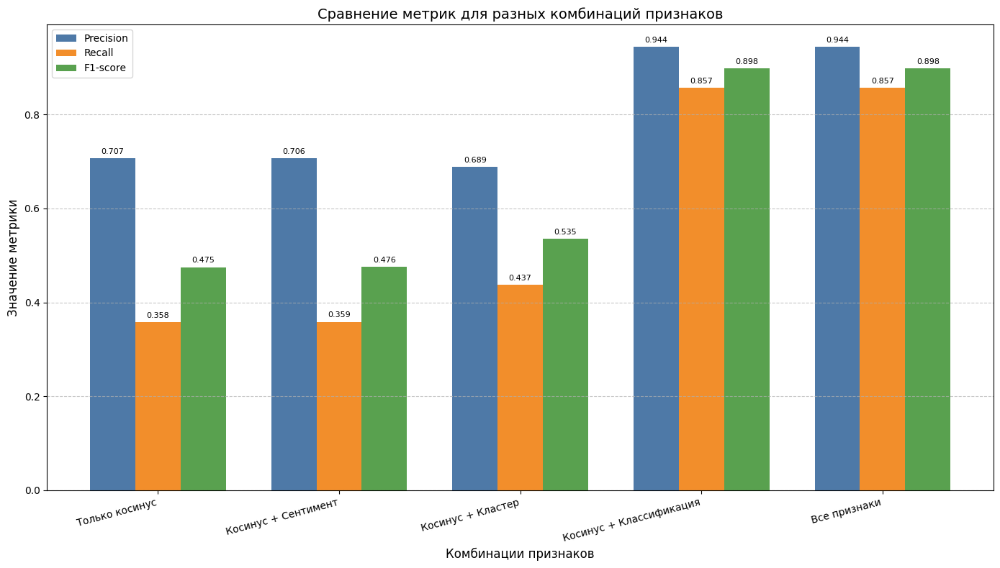

In [145]:
print_metrics(precisions = [p1, p2, p3, p4, p5], recalls = [r1, r2, r3, r4, r5], f1_scores = [f1, f2, f3, f4, f5])

# AG News, ~120k примеров
# BERT-векторизация, лог.регрессия, KMeans, TextBlob (Сентимент-анализ)

In [2]:
#!pip install --upgrade transformers accelerate

In [ ]:
import time
import numpy as np
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModel
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score
from textblob import TextBlob
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch

# 1. Загрузка AG News (~120 000 примеров)
t1 = time.perf_counter()
dataset = load_dataset('ag_news')
texts  = list(dataset['train']['text']) + list(dataset['test']['text'])
labels = [str(l) for l in (list(dataset['train']['label']) + list(dataset['test']['label']))]
print(f"t1 (load)        = {time.perf_counter() - t1:.1f}s")

# 2. BERT-эмбеддинги (mean-pooling) в батчах
t2 = time.perf_counter()
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
model     = AutoModel.from_pretrained('bert-base-uncased')
model.eval()

batch_size = 256
embeds = []
with torch.no_grad():
    for i in tqdm(range(0, len(texts), batch_size), desc="Embedding texts"):
        batch = texts[i:i+batch_size]
        enc = tokenizer(batch, padding=True, truncation=True, return_tensors='pt')
        out = model(**enc)                        # [batch, seq, hidden]
        last = out.last_hidden_state              # векторы токенов
        mask = enc.attention_mask.unsqueeze(-1)   # [batch, seq, 1]
        summed = (last * mask).sum(1)             # суммарный вектор
        counts = mask.sum(1)                      # число валидных токенов
        mean_pooled = summed / counts             # [batch, hidden]
        embeds.append(mean_pooled.cpu().numpy())
X_emb = np.vstack(embeds)  # форма [len(texts), 768]
print(f"t2 (embed)      = {time.perf_counter() - t2:.1f}s")

# 3. Лог. регрессия на 20% + предсказания
t3 = time.perf_counter()
X_tr, _, y_tr, _ = train_test_split(
    X_emb, labels, train_size=0.2, stratify=labels, random_state=42
)
clf = LogisticRegression(max_iter=1000, class_weight='balanced')
clf.fit(X_tr, y_tr)
y_pred_all = clf.predict(X_emb)
print(f"t3 (classify)   = {time.perf_counter() - t3:.1f}s")

# 4. KMeans-кластеризация эмбеддингов
t4 = time.perf_counter()
kmeans = KMeans(n_clusters=20, random_state=42)
cluster_labels = kmeans.fit_predict(X_emb)
print(f"t4 (cluster)    = {time.perf_counter() - t4:.1f}s")

# 5. Сентимент TextBlob
t5 = time.perf_counter()
sentiments = [TextBlob(doc).sentiment.polarity for doc in texts]
print(f"t5 (sentiment)  = {time.perf_counter() - t5:.1f}s")

# 6. Генерация пар и меток
t6 = time.perf_counter()
pairs = []
pair_labels = []
unique_labels = sorted(set(labels))

# положительные пары
for lbl in unique_labels:
    idxs = [i for i,l in enumerate(labels) if l==lbl]
    for a,b in zip(idxs, idxs[1:]):
        pairs.append((a,b))
        pair_labels.append(1)

# отрицательные
neg_needed = len(pair_labels)
rng = np.random.RandomState(42)
pbar = tqdm(total=neg_needed, desc="Generating negative pairs")
while pbar.n < neg_needed:
    a,b = rng.choice(len(texts), 2, replace=False)
    if labels[a] != labels[b]:
        pairs.append((a,b))
        pair_labels.append(0)
        pbar.update(1)
pbar.close()

assert len(pairs) == len(pair_labels)
y_pairs = np.array(pair_labels)
print(f"t6 (pair gen)   = {time.perf_counter() - t6:.1f}s")

# 7. Построение признаков
t7 = time.perf_counter()
def pair_features(i, j):
    cos        = cosine_similarity([X_emb[i]], [X_emb[j]])[0,0]
    sent_sim   = 1 - abs(sentiments[i] - sentiments[j])
    clust_same = int(cluster_labels[i] == cluster_labels[j])
    class_same = int(y_pred_all[i] == y_pred_all[j])
    return [cos, sent_sim, clust_same, class_same]

features = np.vstack([pair_features(i,j) for i,j in pairs])
assert features.shape[0] == y_pairs.shape[0]
print(f"t7 (features)   = {time.perf_counter() - t7:.1f}s")

# 8. Оценка моделей
t8 = time.perf_counter()
def eval_model(Xf):
    m = LogisticRegression(max_iter=1000, class_weight='balanced')
    m.fit(Xf, y_pairs)
    yp = m.predict(Xf)
    return precision_score(y_pairs, yp), recall_score(y_pairs, yp), f1_score(y_pairs, yp)

p1,r1,f1 = eval_model(features[:,[0]])
p2,r2,f2 = eval_model(features[:,[0,1]])
p3,r3,f3 = eval_model(features[:,[0,2]])
p4,r4,f4 = eval_model(features[:,[0,3]])
p5,r5,f5 = eval_model(features)
print("Precision:", p1, p2, p3, p4, p5)
print("Recall:   ", r1, r2, r3, r4, r5)
print("F1-score: ", f1, f2, f3, f4, f5)
print(f"t8 (evaluate)   = {time.perf_counter() - t8:.1f}s")


t1 (load)        = 19.5s


Embedding texts:   0%|          | 0/499 [00:00<?, ?it/s]/Users/alexrust/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1762: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Embedding texts: 100%|██████████| 499/499 [6:22:54<00:00, 46.04s/it]      


t2 (embed)      = 2899.1s
t3 (classify)   = 7.2s


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


t4 (cluster)    = 4.5s
t5 (sentiment)  = 13.1s


Generating negative pairs: 100%|██████████| 127596/127596 [1:22:18<00:00, 25.84it/s]  


t6 (pair gen)   = 180.2s
t7 (features)   = 48.2s
Precision: 0.6844086021505377 0.6846712904016639 0.7065622321602838 0.938891172586302 0.9376671341341254
Recall:    0.6784225210821656 0.6785165679174896 0.652543966895514 0.8413273143358726 0.8436549735101414
F1-score:  0.6814024150254254 0.6815800350331634 0.6784796098387774 0.8874357776739841 0.8881802317666327
t8 (evaluate)   = 0.6s


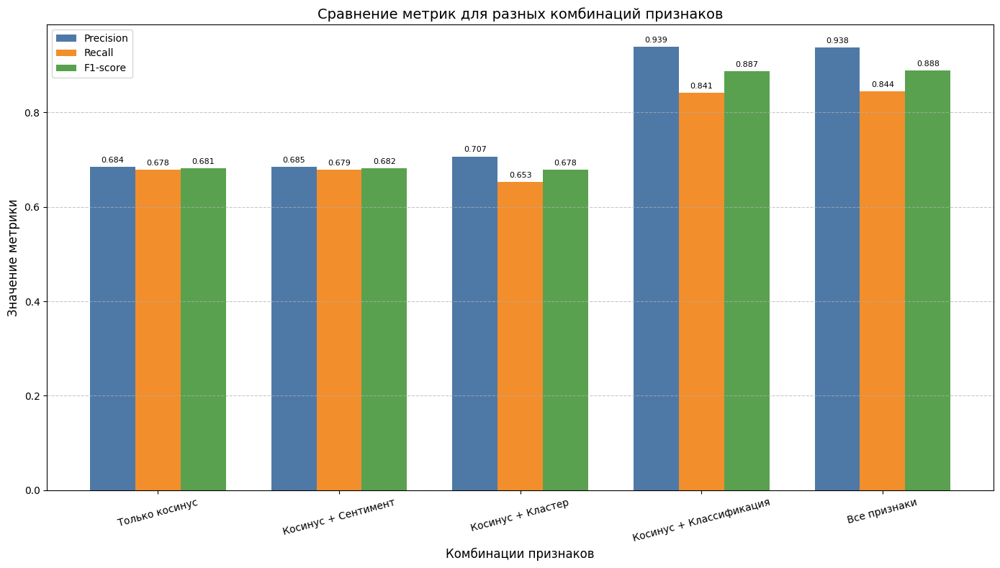

In [19]:
print_metrics(precisions = [p1, p2, p3, p4, p5], recalls = [r1, r2, r3, r4, r5], f1_scores = [f1, f2, f3, f4, f5])

### Тот же вариант без утечки

In [ ]:
import time
import numpy as np
from datasets import load_dataset
from transformers import AutoTokenizer, AutoModel
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score
from textblob import TextBlob
from tqdm import tqdm
import torch

# 1. Загрузка AG News
t1 = time.perf_counter()
dataset = load_dataset('ag_news')
texts   = list(dataset['train']['text']) + list(dataset['test']['text'])
labels  = [str(l) for l in (dataset['train']['label'] + dataset['test']['label'])]
print(f"Loaded {len(texts)} docs in {time.perf_counter() - t1:.1f}s")

# 2. BERT-эмбеддинги с mean-pooling
t2 = time.perf_counter()
tokenizer = AutoTokenizer.from_pretrained('bert-base-uncased')
model     = AutoModel.from_pretrained('bert-base-uncased').eval()

batch_size = 256
embeds = []
with torch.no_grad():
    for i in tqdm(range(0, len(texts), batch_size), desc="Embedding texts"):
        batch = texts[i:i+batch_size]
        enc = tokenizer(batch, padding=True, truncation=True, return_tensors='pt')
        out = model(**enc)
        last = out.last_hidden_state
        mask = enc.attention_mask.unsqueeze(-1)
        summed = (last * mask).sum(1)
        counts = mask.sum(1)
        embeds.append((summed / counts).cpu().numpy())

X_emb = np.vstack(embeds)
print(f"Embedded in {time.perf_counter() - t2:.1f}s")

# 3. Out-of-fold предсказания логистической регрессии
t3 = time.perf_counter()
clf = LogisticRegression(max_iter=1000, class_weight='balanced')
y_pred_all = cross_val_predict(
    clf, X_emb, labels,
    cv=5,            # 5-fold CV
    method='predict',
    n_jobs=-1
)
print(f"CV predictions in {time.perf_counter() - t3:.1f}s")

# 4. KMeans-кластеризация
t4 = time.perf_counter()
cluster_labels = KMeans(n_clusters=20, random_state=42).fit_predict(X_emb)
print(f"Clustered in {time.perf_counter() - t4:.1f}s")

# 5. Сентимент TextBlob
t5 = time.perf_counter()
sentiments = [TextBlob(doc).sentiment.polarity for doc in texts]
print(f"Sentiment in {time.perf_counter() - t5:.1f}s")

# 6. Генерация сбалансированных пар
t6 = time.perf_counter()
pairs, pair_labels = [], []
unique_labels = sorted(set(labels))

for lbl in unique_labels:
    idxs = [i for i, l in enumerate(labels) if l == lbl]
    for a, b in zip(idxs, idxs[1:]):
        pairs.append((a, b)); pair_labels.append(1)

neg_needed = len(pair_labels)
rng = np.random.RandomState(42)
pbar = tqdm(total=neg_needed, desc="Neg pairs")
while pbar.n < neg_needed:
    a, b = rng.choice(len(texts), 2, replace=False)
    if labels[a] != labels[b]:
        pairs.append((a, b)); pair_labels.append(0)
        pbar.update(1)
pbar.close()

assert len(pairs) == len(pair_labels)
y_pairs = np.array(pair_labels)
print(f"Generated {len(pairs)} pairs in {time.perf_counter() - t6:.1f}s")

# 7. Построение признаков и оценка
def pair_features(i, j):
    return [
        cosine_similarity([X_emb[i]], [X_emb[j]])[0,0],
        1 - abs(sentiments[i] - sentiments[j]),
        int(cluster_labels[i] == cluster_labels[j]),
        int(y_pred_all[i] == y_pred_all[j])
    ]

t7 = time.perf_counter()
features = np.vstack([pair_features(i, j) for i, j in pairs])
assert features.shape[0] == y_pairs.shape[0]
print(f"Built features in {time.perf_counter() - t7:.1f}s")

def eval_model(cols):
    Xf = features[:, cols]
    m = LogisticRegression(max_iter=1000, class_weight='balanced')
    m.fit(Xf, y_pairs)
    yp = m.predict(Xf)
    return precision_score(y_pairs, yp), recall_score(y_pairs, yp), f1_score(y_pairs, yp)

t8 = time.perf_counter()
for name, cols in [
    ("cosine", [0]),
    ("cosine+sentiment", [0,1]),
    ("cosine+cluster", [0,2]),
    ("cosine+class", [0,3]),
    ("all", [0,1,2,3])
]:
    p,r,f = eval_model(cols)
    print(f"{name}: Precision={p:.3f}, Recall={r:.3f}, F1={f:.3f}")

print(f"Done in {time.perf_counter() - t8:.1f}s")


Embedding texts: 100%|██████████| 499/499 [48:01<00:00,  5.77s/it]  

Embedded in 26396.2s



huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
TOKENIZERS_PARALLELISMTo disable this warning, you can either:
=(true | false)
	- Avoid using `tokenizers` before the fork if possible


CV predictions in 45.9s
Clustered in 4.7s
Sentiment in 13.1s


Neg pairs: 100%|██████████| 127596/127596 [02:23<00:00, 887.22it/s]


Generated 255192 pairs in 143.9s
Built features in 32.1s
cosine: Precision=0.684, Recall=0.678, F1=0.681
cosine+sentiment: Precision=0.685, Recall=0.679, F1=0.682
cosine+cluster: Precision=0.707, Recall=0.653, F1=0.678
cosine+class: Precision=0.938, Recall=0.838, F1=0.885
all: Precision=0.936, Recall=0.840, F1=0.886
Done in 0.6s


In [24]:
p1,r1,f1 = eval_model([0])
p2,r2,f2 = eval_model([0,1])
p3,r3,f3 = eval_model([0,2])
p4,r4,f4 = eval_model([0,3])
p5,r5,f5 = eval_model([0,1,2,3])

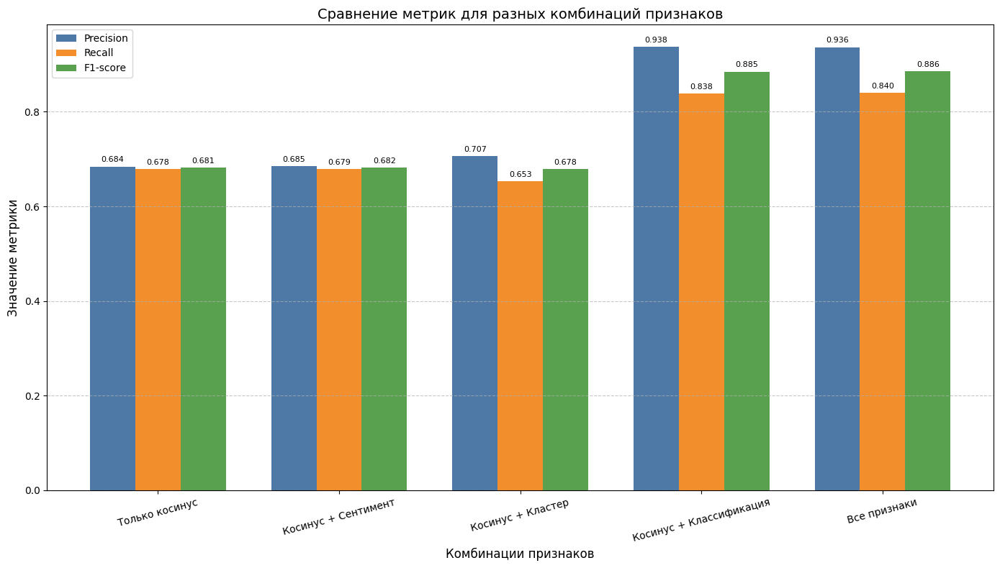

In [25]:
print_metrics(precisions = [p1, p2, p3, p4, p5], recalls = [r1, r2, r3, r4, r5], f1_scores = [f1, f2, f3, f4, f5])